In [1]:
#Basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
from pandas import DataFrame 
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf 
from statsmodels.graphics.tsaplots import plot_pacf
from pandas.plotting import lag_plot 
from statsmodels.tsa.stattools import adfuller 
from numpy import sqrt
from numpy import log
from numpy import cbrt
from numpy import exp
import statsmodels.formula.api as smf 
from statsmodels.tsa.holtwinters import SimpleExpSmoothing 
from statsmodels.tsa.holtwinters import Holt
from statsmodels.tsa.holtwinters import ExponentialSmoothing 
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import GRU, Dense
from keras.layers import LSTM
from keras  import callbacks
from keras import optimizers
import math
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.ar_model import AutoReg
import pmdarima as pmd
from pmdarima import auto_arima 
from statsmodels.tsa.arima.model import ARIMA 
import statsmodels.api as sm 
import warnings
warnings.filterwarnings('ignore') 

In [2]:
#Loading Dataset
df = pd.read_csv('oil data update.csv ')
df

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09


In [3]:
df.describe()

,Price
count,9339.000000
mean,46.028511
std,29.515461
min,9.060000
25%,20.000000
50%,36.060000
75%,66.910000
max,145.310000


In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9345 entries, 0 to 9344
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    9345 non-null   object 
 1   Price   9339 non-null   float64
dtypes: float64(1), object(1)
memory usage: 146.1+ KB
None


In [5]:
print(df.shape)

(9345, 2)


In [6]:
df.duplicated().sum()

0

In [7]:
df.mean()

Price    46.028511
dtype: float64

In [8]:
df.var()

Price    871.16243
dtype: float64

In [9]:
df.kurt()

Price   -0.553953
dtype: float64

In [10]:
df.skew()

Price    0.761338
dtype: float64

In [11]:
#Checking is there any missing values are there in data or not
df.isnull().any()

Date     False
Price     True
dtype: bool

In [12]:
df.isna().sum()

Date     0
Price    6
dtype: int64

In [13]:
df[df.isnull().any(axis=1)]

,Date,Price
8060,23-11-2017,NaN
8082,25-12-2017,NaN
8087,01-01-2018,NaN
8097,15-01-2018,NaN
8122,19-02-2018,NaN
8151,30-03-2018,NaN


There are 6 null values present in our data. so, we can either drop them or apply imputation technique to fill the null values.

In [14]:
mean = df['Price'].mean()
print(mean)

46.02851054716778


# imputation technique for null values

In [15]:
df['Price']=df['Price'].fillna(mean)
df

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09


In [16]:
df1=df.copy()
df1

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09


In [17]:
df1['Date']=pd.to_datetime(df1.Date)
df1


,Date,Price
0,1986-02-01,25.56
1,1986-03-01,26.00
2,1986-06-01,26.53
3,1986-07-01,25.85
4,1986-08-01,25.87
...,...,...
9340,2022-12-15,76.11
9341,2022-12-16,74.29
9342,2022-12-19,75.19
9343,2022-12-20,76.09


In [18]:
df1.dtypes

Date     datetime64[ns]
Price           float64
dtype: object

In [19]:
df1['Year'] = df1['Date'].dt.year
df1

,Date,Price,Year
0,1986-02-01,25.56,1986
1,1986-03-01,26.00,1986
2,1986-06-01,26.53,1986
3,1986-07-01,25.85,1986
4,1986-08-01,25.87,1986
...,...,...,...
9340,2022-12-15,76.11,2022
9341,2022-12-16,74.29,2022
9342,2022-12-19,75.19,2022
9343,2022-12-20,76.09,2022


In [20]:
df1.corr()

,Price,Year
Price,1.000000,0.723501
Year,0.723501,1.000000


(array([0.5, 1.5]), [Text(0.5, 0, 'Price'), Text(1.5, 0, 'Year')])

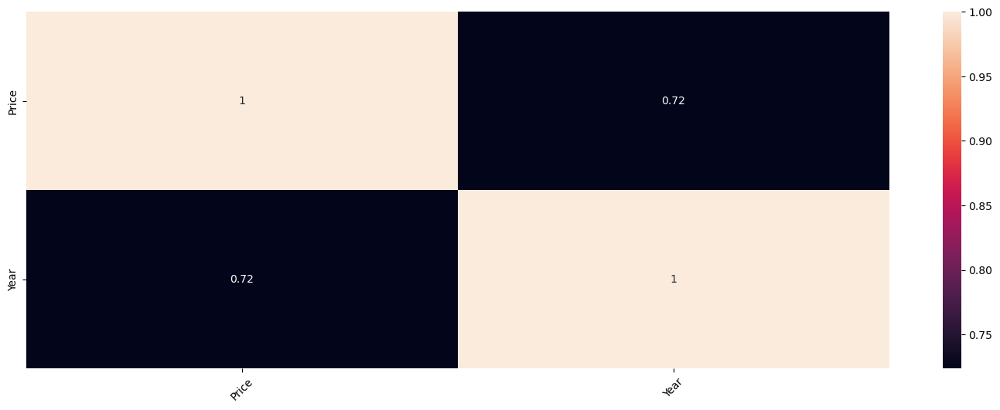

In [21]:
fig= plt.figure(figsize=(18, 6))
sns.heatmap(df1.corr(), annot=True);
plt.xticks(rotation=45)

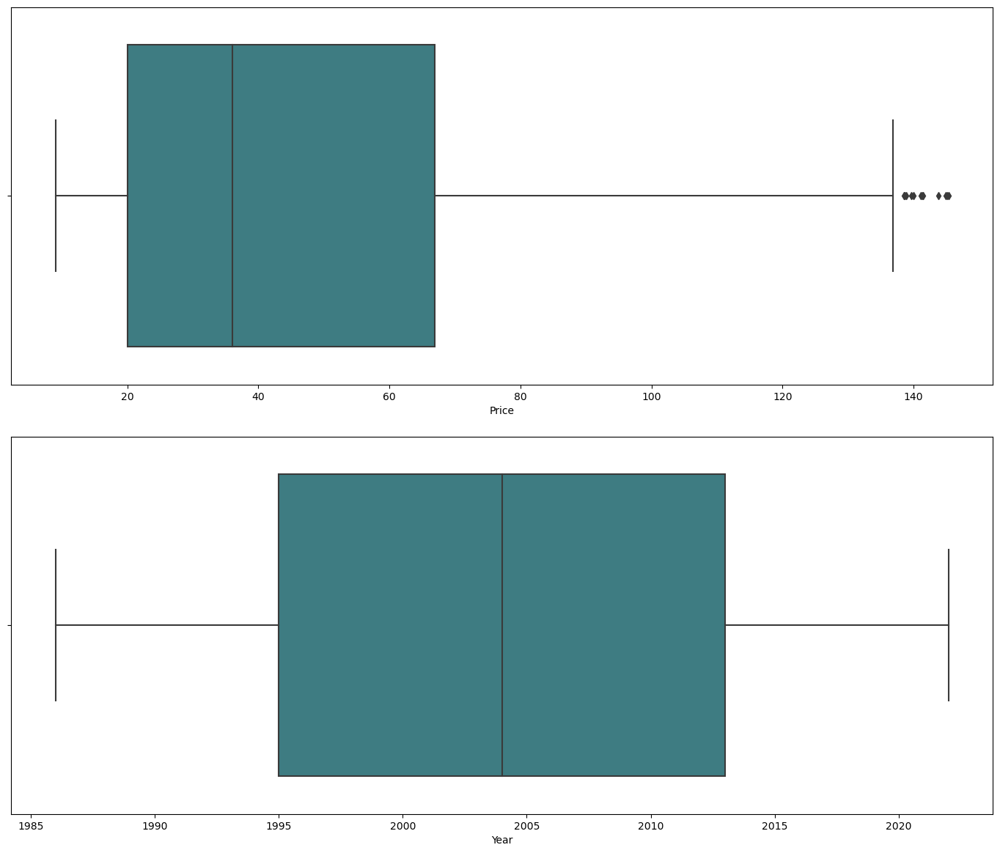

In [22]:
ot=df1.copy() 
fig, axes=plt.subplots(2,1,figsize=(14,12),sharex=False,sharey=False)
sns.boxplot(x='Price',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='Year',data=ot,palette='crest',ax=axes[1])
plt.tight_layout(pad=2.0)

<AxesSubplot: ylabel='Density'>

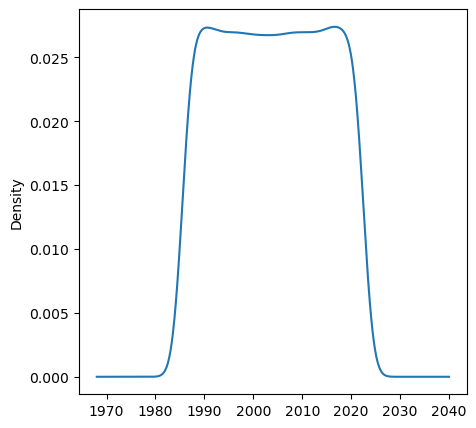

In [23]:
plt.figure(figsize=(5,5))
df1['Year'].plot(kind='density')

<AxesSubplot: xlabel='Year', ylabel='Density'>

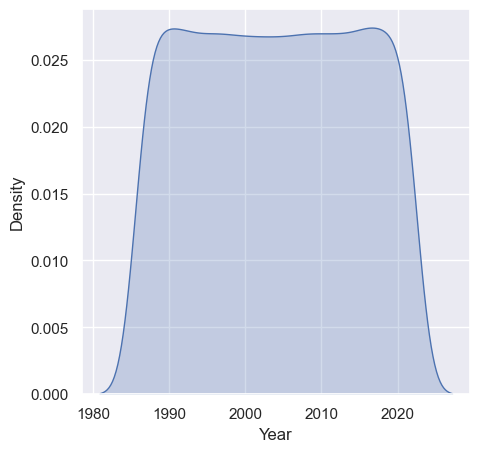

In [24]:
sns.set(rc={'figure.figsize':(5,5)})
sns.kdeplot(df1['Year'], shade=True)

<AxesSubplot: xlabel='Year', ylabel='Density'>

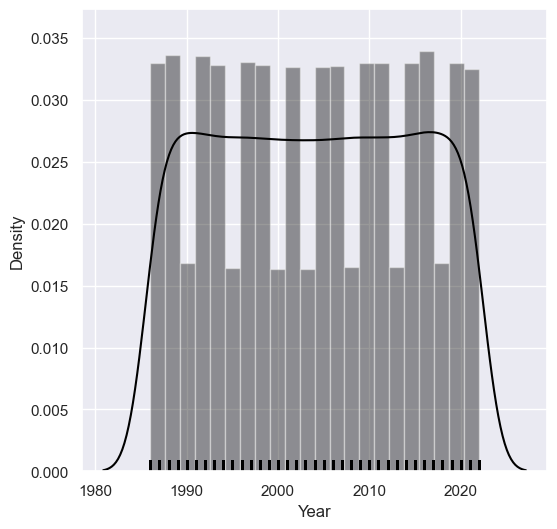

In [25]:
sns.set(rc={'figure.figsize':(6,6)})
sns.distplot(df1['Year'], color='black', rug=True)

<AxesSubplot: >

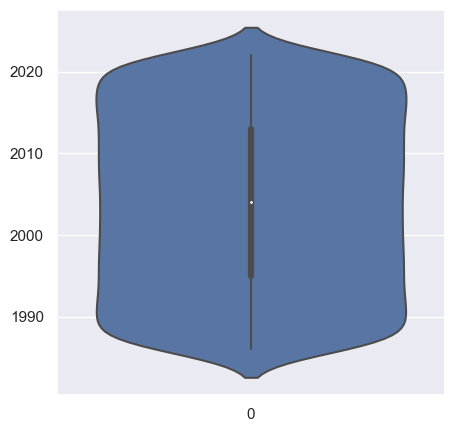

In [26]:
sns.set(rc={'figure.figsize':(5,5)})
sns.violinplot(df1['Year'], orient='vertical')

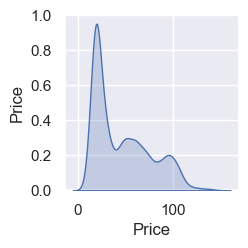

In [27]:
g = sns.pairplot(df, diag_kind="kde", markers="+",
                 plot_kws=dict(s=50, edgecolor="b", linewidth=1),
                 diag_kws=dict(shade=True))

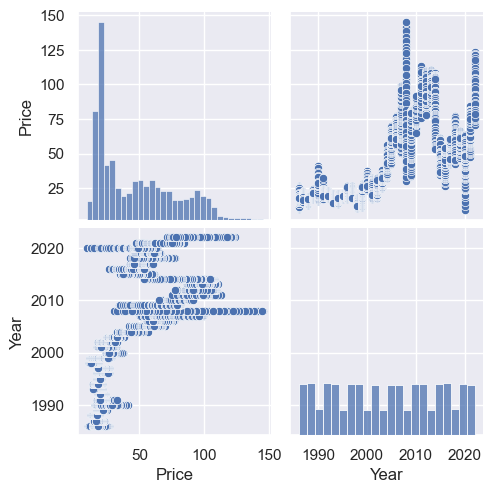

In [28]:
sns.pairplot(df1)

<AxesSubplot: xlabel='Year', ylabel='count'>

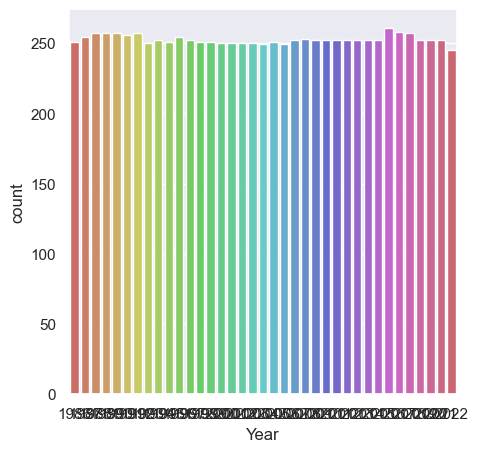

In [29]:
sns.countplot(x = 'Year', data = df1, palette = 'hls')

In [30]:
df.set_index('Date', inplace=True)
df

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


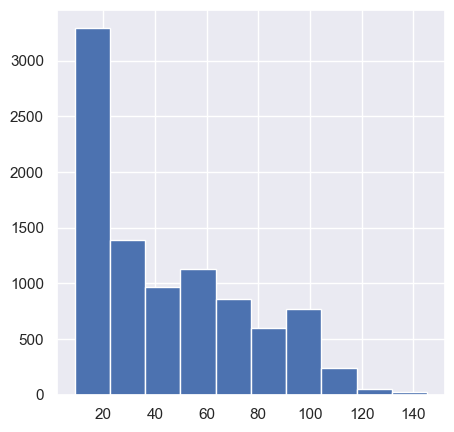

In [31]:
#Outlier detection
plt.hist(df['Price'])
plt.show()

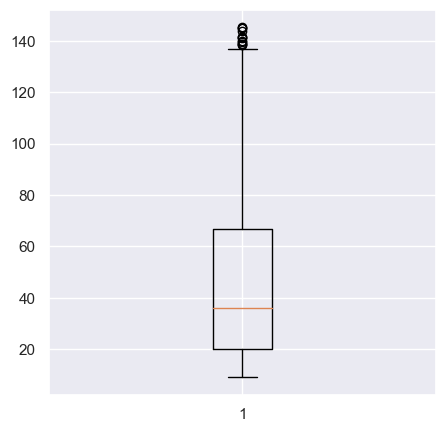

In [32]:
plt.boxplot(df['Price'])
plt.show()

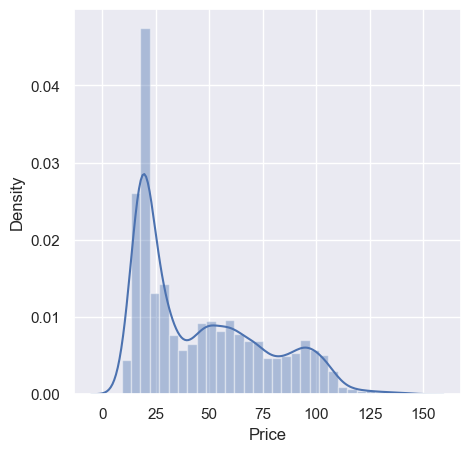

In [33]:
sns.distplot(df['Price'])
plt.show()

In [34]:
Q1 = np.percentile(df,25,interpolation='midpoint')
Q1

20.0

In [35]:
Q3 = np.percentile(df,75,interpolation='midpoint')
Q3

66.9

In [36]:
IQR = Q3 - Q1
IQR

46.900000000000006

In [37]:
Q3+1.5*IQR 

137.25

In [38]:
Q1-1.5*IQR

-50.35000000000001

In [39]:
#Observations which are lying above the upper extreme point 
upper = np.where(df > (Q3+1.5*IQR)) 
upper 

(array([5659, 5673, 5674, 5675, 5676, 5677, 5678, 5679, 5682, 5683, 5684,
        5685], dtype=int64),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64))

In [40]:
lower = np.where(df < (Q1-1.5*IQR)) 
lower

(array([], dtype=int64), array([], dtype=int64))

In [41]:
#Removing Outliers
df2=df.drop(df.index[[5659, 5673, 5674, 5675, 5676, 5677, 5678, 5679, 5682, 5683, 5684,5685]],axis=0)
df2

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


In [42]:
df2.describe()

,Price
count,9333.000000
mean,45.905668
std,29.325105
min,9.060000
25%,19.990000
50%,35.980000
75%,66.730000
max,136.910000


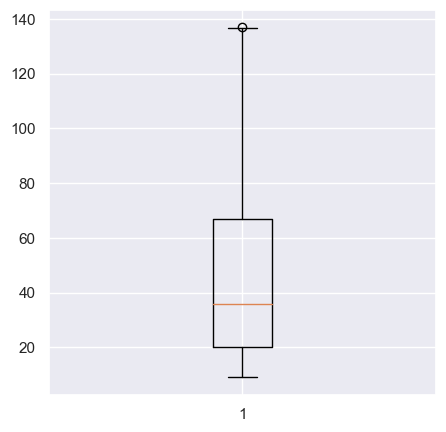

In [43]:
plt.boxplot(df2['Price'])
plt.show()

In [44]:
print(np.where(df2>=136.91))

(array([5662], dtype=int64), array([0], dtype=int64))


In [45]:
df3=df2.drop(df2.index[[5662]],axis=0)
df3

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


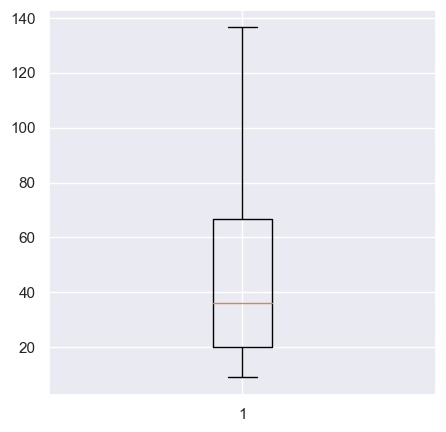

In [46]:
plt.boxplot(df3['Price'])
plt.show()

##### Now data is free from Outliers

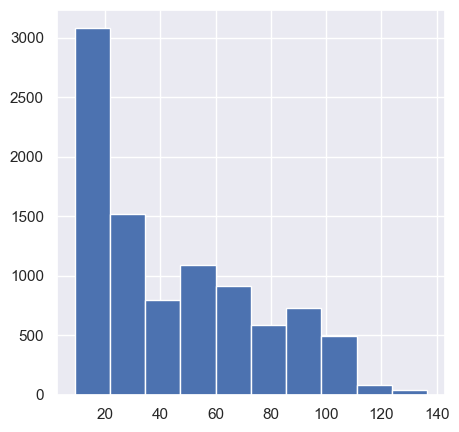

In [47]:
plt.hist(df3['Price'])
plt.show()

In [48]:
df3.describe()

,Price
count,9332.000000
mean,45.895916
std,29.311539
min,9.060000
25%,19.990000
50%,35.975000
75%,66.730000
max,136.540000


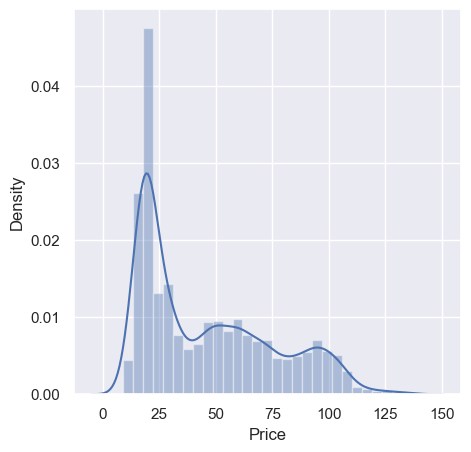

In [49]:
sns.distplot(df3['Price'])
plt.show()

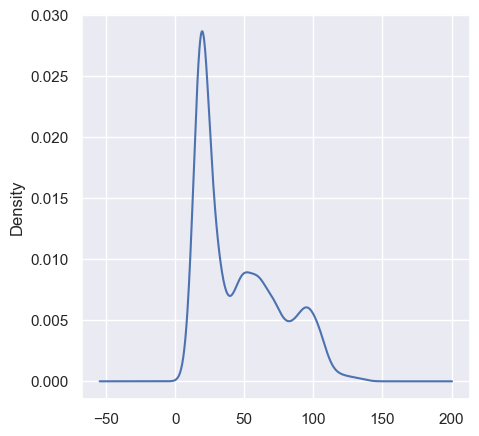

In [50]:
df3['Price'].plot(kind='kde')
plt.show()

In [51]:
df4=df3.reset_index()
df4

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [52]:
df4.dtypes

Date      object
Price    float64
dtype: object

In [53]:
df4['Date']=pd.to_datetime(df4.Date)
df4

,Date,Price
0,1986-02-01,25.56
1,1986-03-01,26.00
2,1986-06-01,26.53
3,1986-07-01,25.85
4,1986-08-01,25.87
...,...,...
9327,2022-12-15,76.11
9328,2022-12-16,74.29
9329,2022-12-19,75.19
9330,2022-12-20,76.09


In [54]:
df4.dtypes

Date     datetime64[ns]
Price           float64
dtype: object

In [55]:
df4["Date"] = pd.to_datetime(df4.Date,format="%b-%y")
df4["Month"] = df4.Date.dt.strftime("%b") # month extraction
df4["Year"] = df4.Date.dt.strftime("%Y") # year extraction
df4 

,Date,Price,Month,Year
0,1986-02-01,25.56,Feb,1986
1,1986-03-01,26.00,Mar,1986
2,1986-06-01,26.53,Jun,1986
3,1986-07-01,25.85,Jul,1986
4,1986-08-01,25.87,Aug,1986
...,...,...,...,...
9327,2022-12-15,76.11,Dec,2022
9328,2022-12-16,74.29,Dec,2022
9329,2022-12-19,75.19,Dec,2022
9330,2022-12-20,76.09,Dec,2022


<AxesSubplot: xlabel='Month', ylabel='Price'>

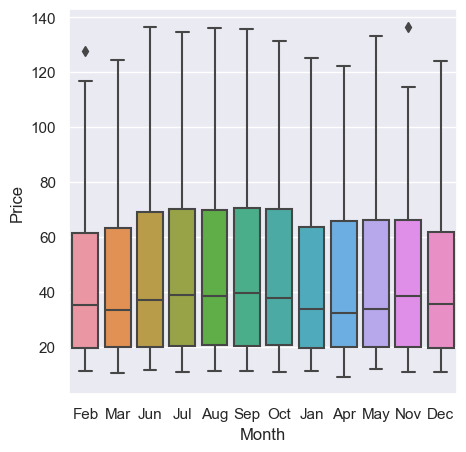

In [56]:
# boxplots by month
sns.boxplot(x = 'Month', y='Price', data = df4)

<AxesSubplot: xlabel='Month', ylabel='Price'>

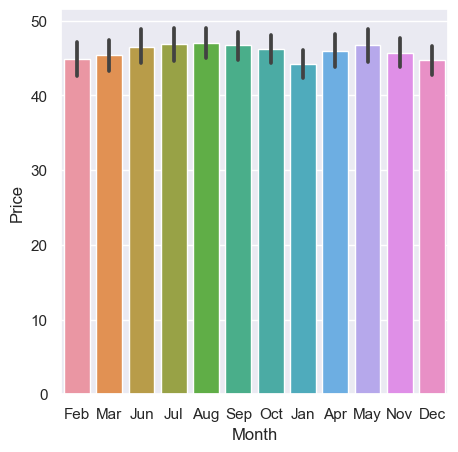

In [57]:
# barplot by month
sns.barplot(x = 'Month', y='Price', data = df4)

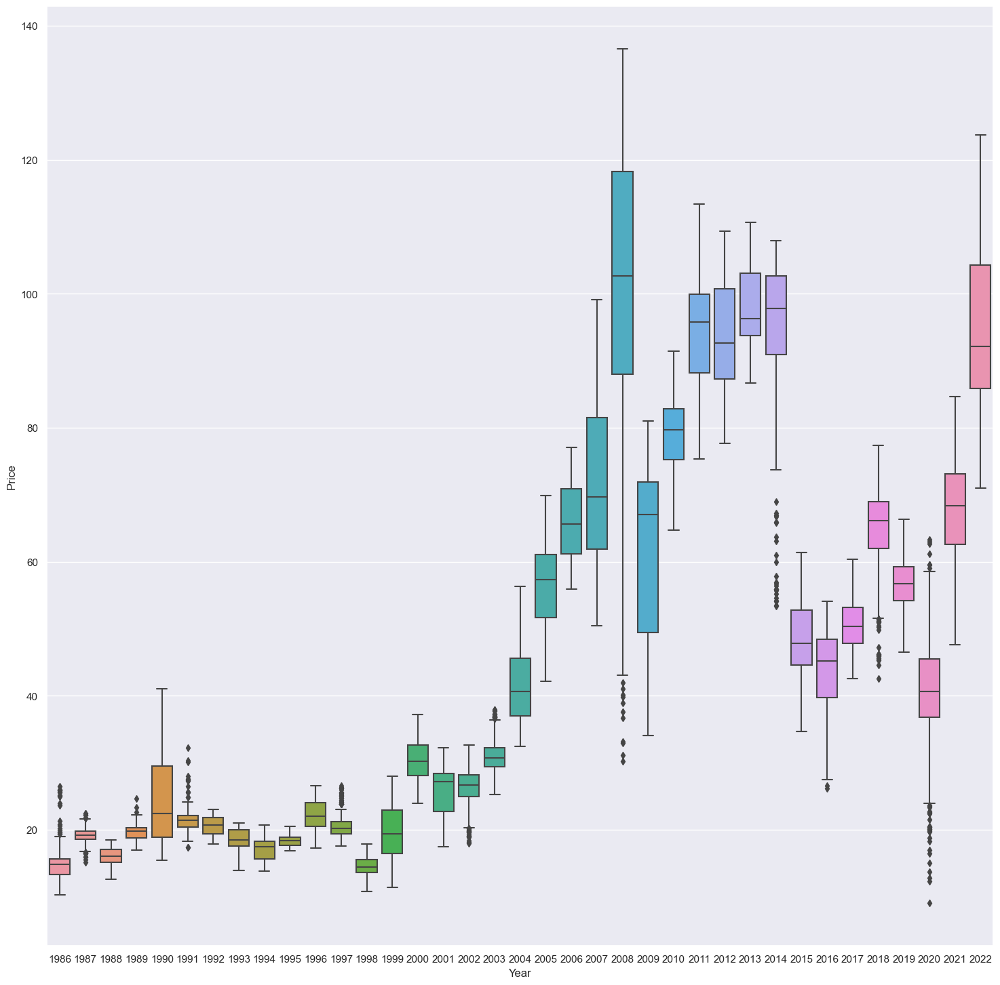

In [58]:
# boxplots by year
plt.figure(figsize=(18,18))
sns.boxplot(x = 'Year', y='Price', data = df4) 
plt.show()

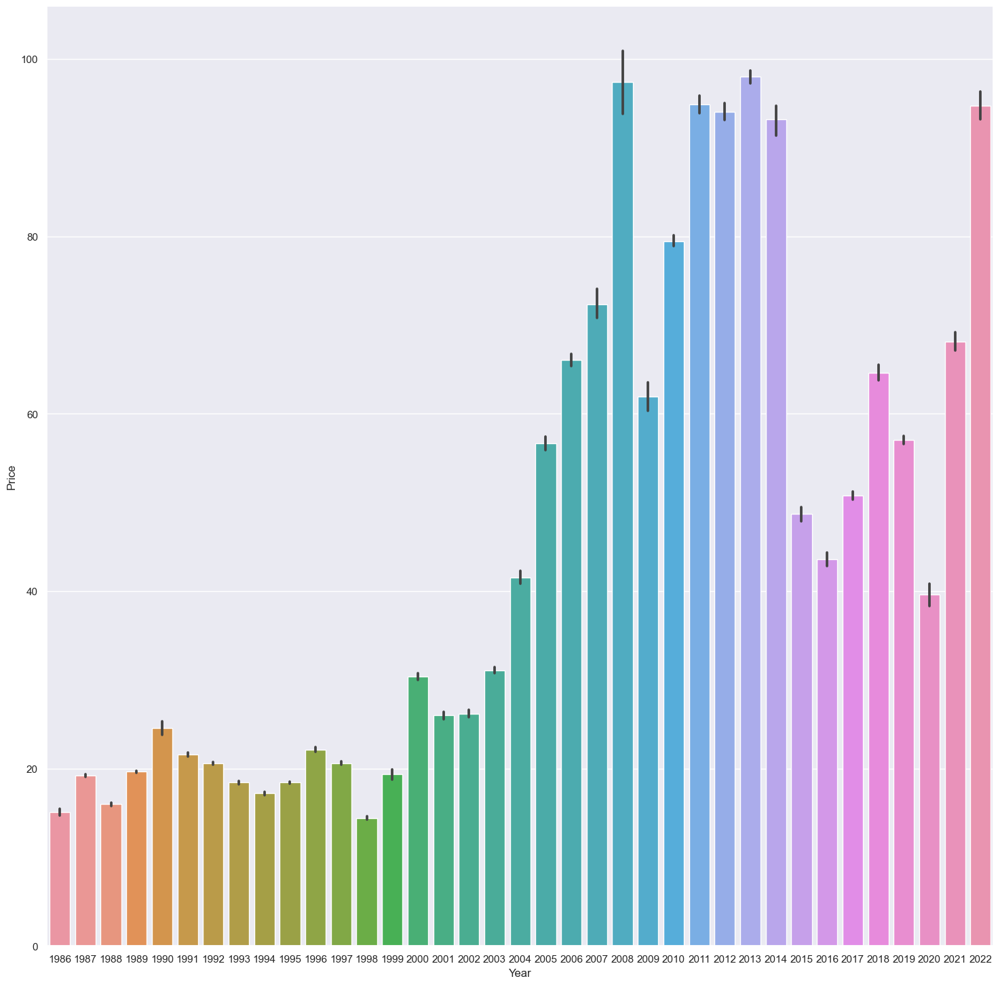

In [59]:
# barplot by year
plt.figure(figsize=(18,18))
sns.barplot(x = 'Year', y='Price', data = df4)
plt.show()

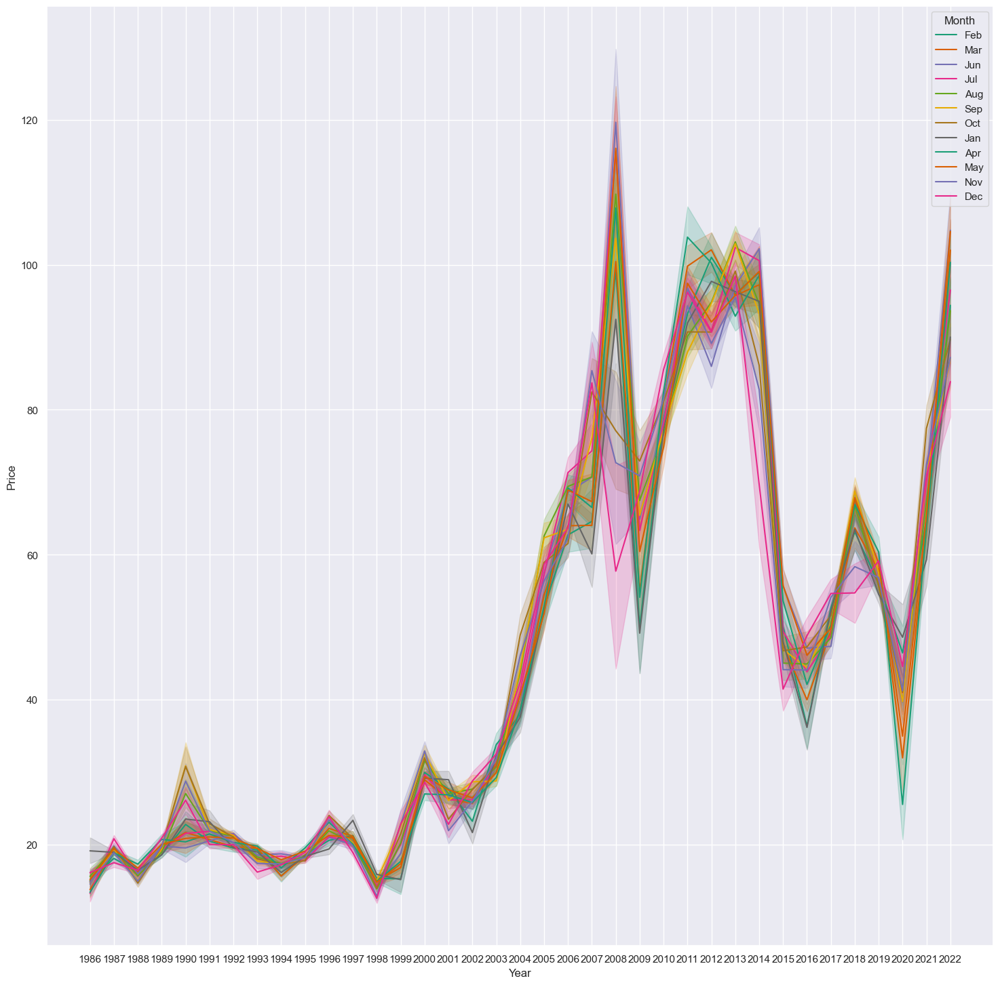

In [60]:
# plotting wideform data
plt.figure(figsize=(18,18))
sns.lineplot(x="Year", y="Price", data=df4, hue="Month", palette="Dark2")
plt.show()

### Heatmap

<AxesSubplot: xlabel='Month', ylabel='Year'>

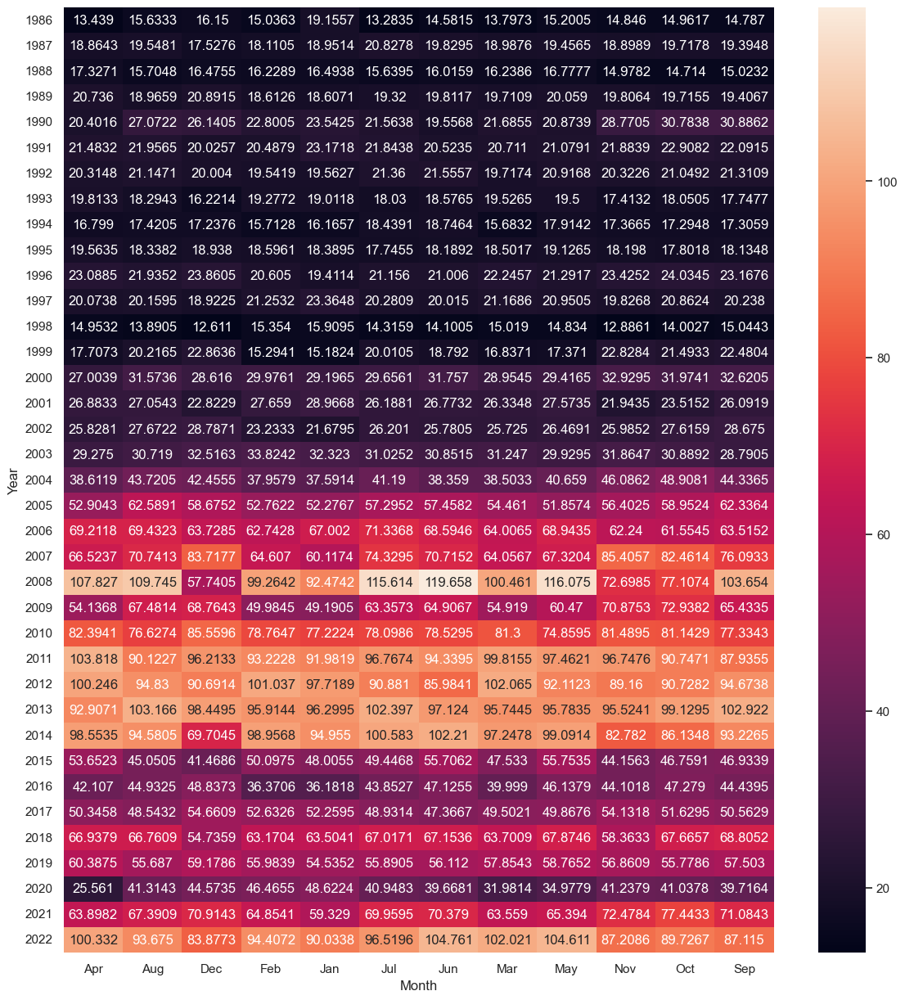

In [61]:
plt.figure(figsize=(14,15))
heatmap = pd.pivot_table(data=df4,values="Price",index="Year",columns="Month",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap,annot=True,fmt="g") 

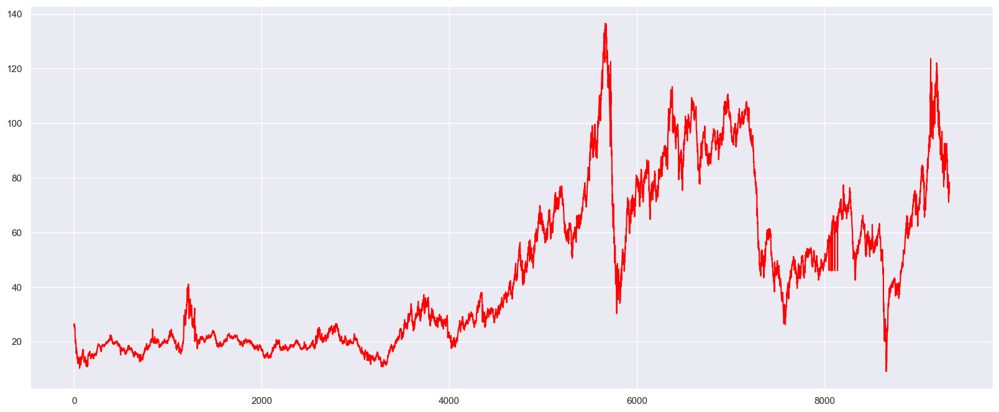

In [62]:
df4['Price'].plot(figsize=(20, 8),color='red')
plt.show()

<AxesSubplot: >

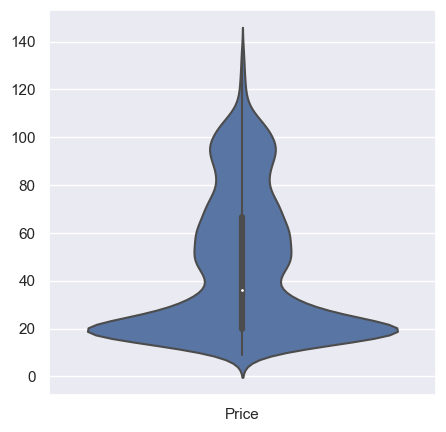

In [63]:
sns.violinplot(X='Date', Y='Price', data=df4) 

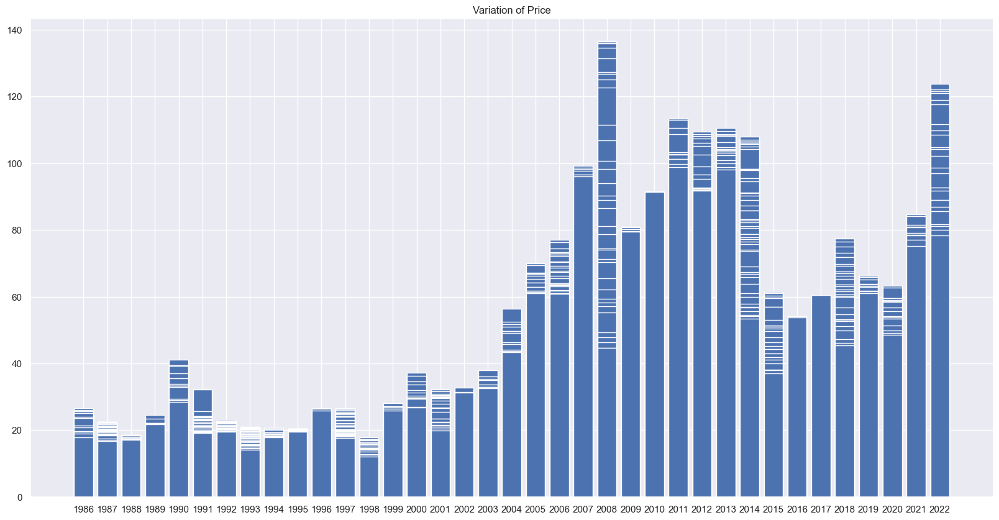

In [64]:
plt.figure(figsize=(20,10))
x=df4['Year']
y=df4['Price']
plt.bar(x,y)
plt.title('Variation of Price')
plt.show() 

<AxesSubplot: xlabel='Year', ylabel='Price'>

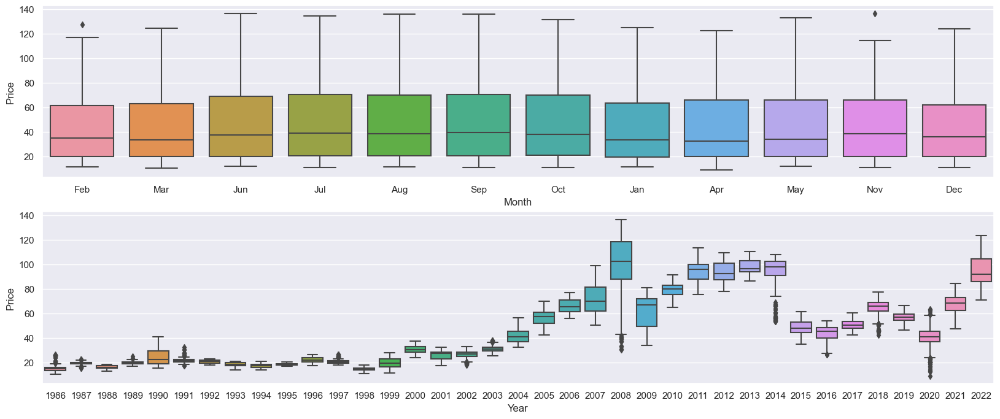

In [65]:
plt.figure(figsize= (20,8))
plt.subplot(211)
sns.boxplot(x="Month", y="Price", data= df4)
plt.subplot(212)
sns.boxplot(x="Year", y= "Price", data=df4) 

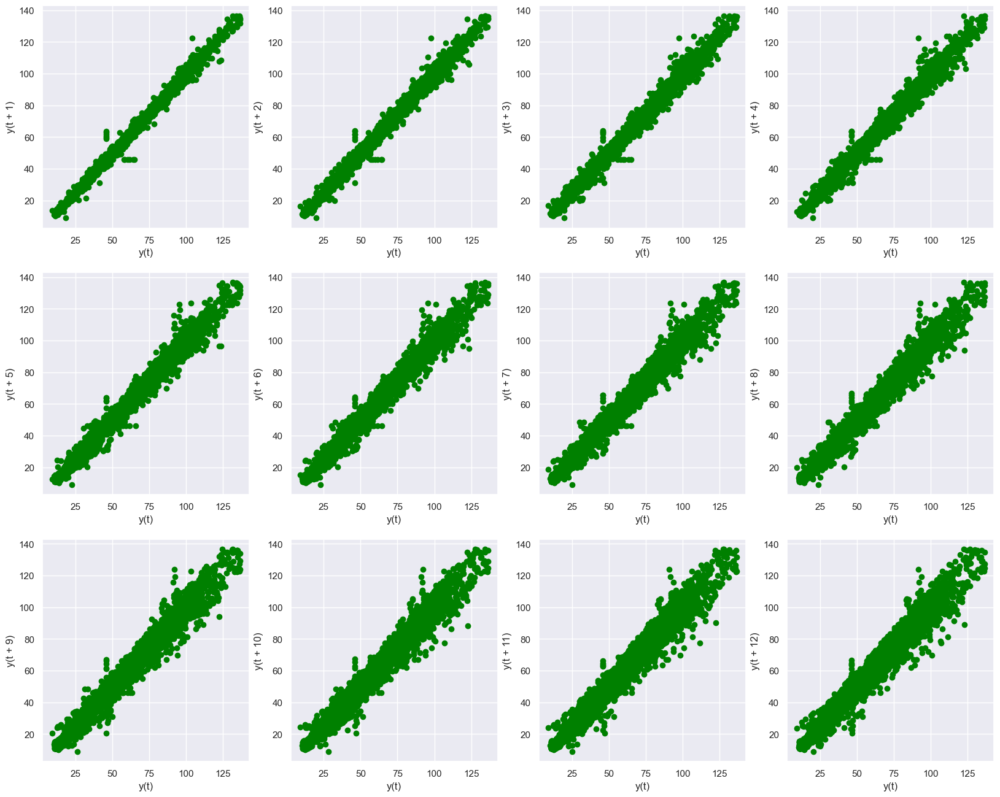

In [66]:
ig, axes = plt.subplots(figsize=(20,16), ncols=4, nrows=3)

lag_plot(df4.Price, lag=1, c = ['green'][0], ax=axes[0,0])
lag_plot(df4.Price, lag=2, c = ['green'][0], ax=axes[0,1])
lag_plot(df4.Price, lag=3, c = ['green'][0], ax=axes[0,2])
lag_plot(df4.Price, lag=4, c = ['green'][0], ax=axes[0,3])
lag_plot(df4.Price, lag=5, c = ['green'][0], ax=axes[1,0])
lag_plot(df4.Price, lag=6, c = ['green'][0], ax=axes[1,1])
lag_plot(df4.Price, lag=7, c = ['green'][0], ax=axes[1,2])
lag_plot(df4.Price, lag=8, c = ['green'][0], ax=axes[1,3])
lag_plot(df4.Price, lag=9, c = ['green'][0], ax=axes[2,0])
lag_plot(df4.Price, lag=10, c = ['green'][0], ax=axes[2,1])
lag_plot(df4.Price, lag=11, c = ['green'][0], ax=axes[2,2])
lag_plot(df4.Price, lag=12, c = ['green'][0], ax=axes[2,3])

plt.show() 

From the above lagplots, we can conclude that the data is having positive correlation with its lags.

# Time Seride Decomposition

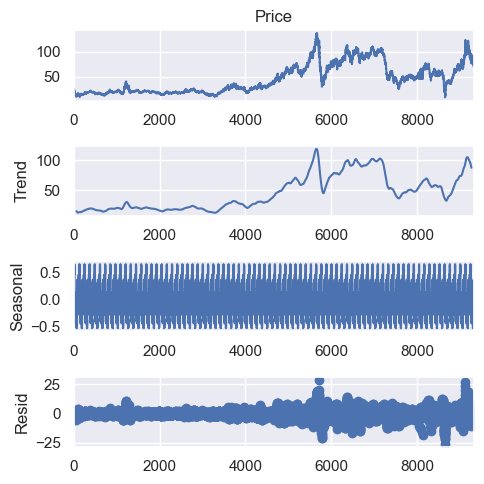

In [67]:
decomposition_ts_add = sm.tsa.seasonal_decompose(df4['Price'], model='additive',period=120)
fig = decomposition_ts_add.plot()
plt.show()

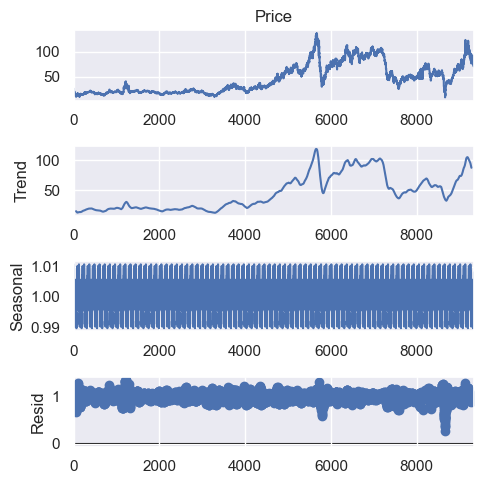

In [68]:
decomposition_ts_mult = sm.tsa.seasonal_decompose(df4['Price'], model='multiplicative',period=120)
fig = decomposition_ts_mult.plot()
plt.show()

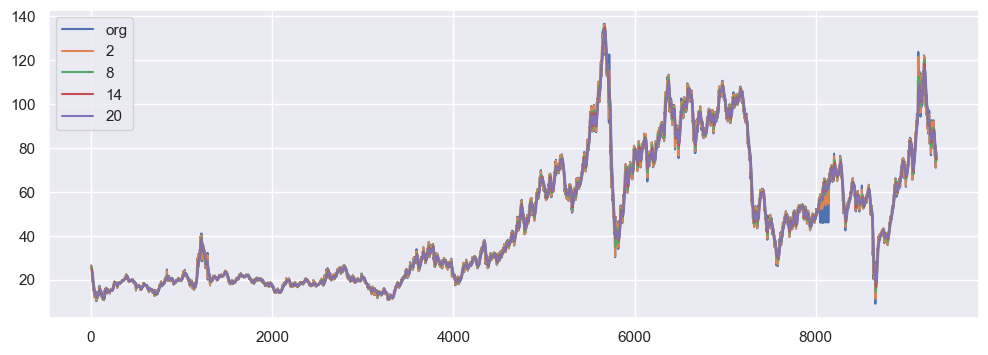

In [69]:
plt.figure(figsize=(12,4))
df4.Price.plot(label="org")
for i in range (2,24,6):
    df4["Price"].rolling(i).mean().plot(label=str(i))
plt.legend(loc="best")

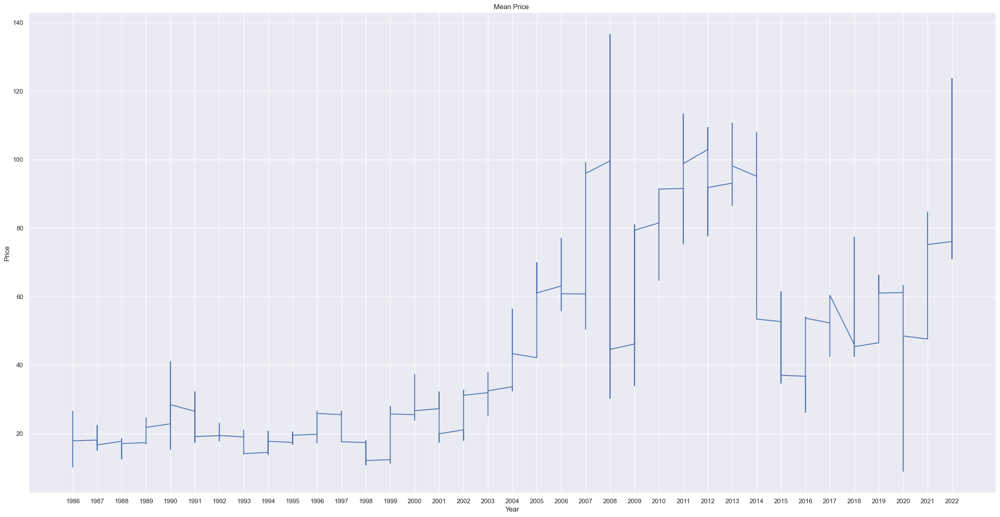

In [70]:
## Time series smoothing  (Stationarity of time series)
plt.figure(figsize=(30,15))
plt.plot(df4.Year,df4.Price)
plt.title("Mean Price ")
plt.xlabel("Year")
plt.ylabel("Price")
plt.show() 
timeseries = df4.loc[:,["Year","Price"]]  ## creating timeseries 
timeseries.index = timeseries.Year
ts = timeseries.drop("Year",axis=1)

In [71]:
df3

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


# Adfuller test (To check for the stationarity of our data)

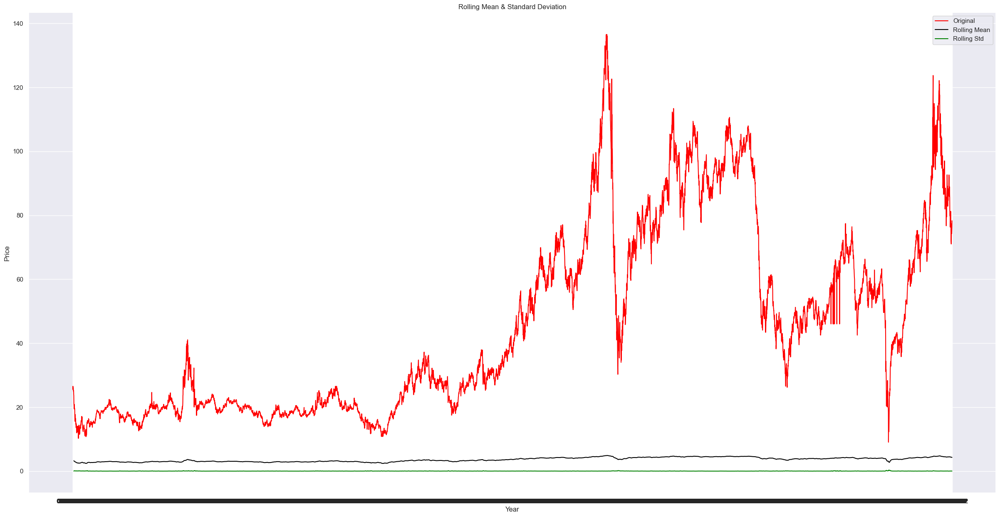

Test statistic: -2.3318047632916854
p-value: 0.16191534495545978
Critical Values: {'1%': -3.431053874661101, '5%': -2.861851068123899, '10%': -2.566935576484507}


In [72]:
#Nul hypothesis = non-stationary; Alternate hypothesis = Stationary
#if p-value > 0.05 - accept null hypothesis(data is non stationary) else accept alternate hypothesis(data is stationary)
def check_adfuller(df3):
    result = adfuller(df3,autolag='AIC')
    print('Test statistic:',result[0])
    print('p-value:',result[1])
    print('Critical Values:',result[4])
def check_mean_std(data3):
    df3_log = np.log(df3)
    moving_avg = df3_log.rolling(12).mean()
    moving_std = df3_log.rolling(12).std()
    plt.figure(figsize=(30,15))
    orig = plt.plot(data3,color = 'red',label = 'Original')
    mean = plt.plot(moving_avg, color = 'black',label= 'Rolling Mean')
    std = plt.plot(moving_std,color = 'green',label= 'Rolling Std')
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
check_mean_std(df3)
check_adfuller(df3.Price) 

Here, the p value is greater than 0.05 (Critical value). So, Accept Null hypothesis i.e., The data is non stationary.

# Applying tranformations to convert non-stationary data to stationary data

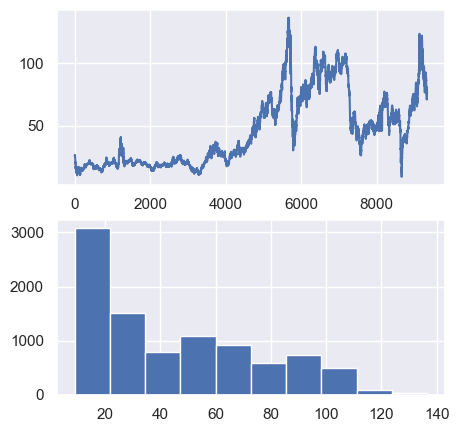

In [73]:
# Linear transform

dataframe_linear = DataFrame(df3.values)
dataframe_linear.columns = ['Price']

# line plot
plt.subplot(211)
plt.plot(dataframe_linear['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_linear['Price'])
plt.show() 

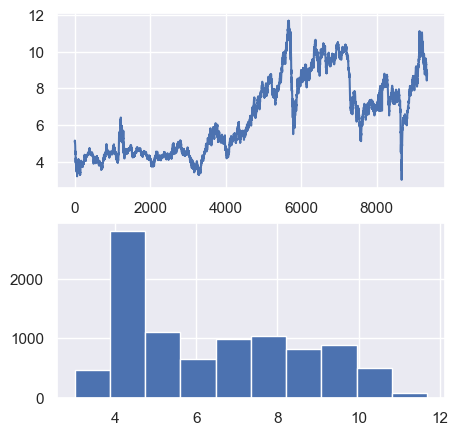

In [74]:
# Square root transform

dataframe_sqrt = DataFrame(df3.values)
dataframe_sqrt.columns = ['Price']
dataframe_sqrt['Price'] = sqrt (dataframe_sqrt['Price']) 

# line plot
plt.subplot(211)
plt.plot(dataframe_sqrt['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_sqrt['Price'])
plt.show()  

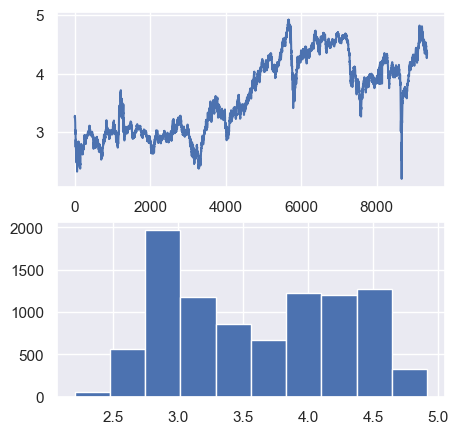

In [75]:
# Log transform

dataframe_log = DataFrame(df3.values)
dataframe_log.columns = ['Price']
dataframe_log['Price'] = log(dataframe_log['Price'])

# line plot
plt.subplot(211)
plt.plot(dataframe_log['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_log['Price'])
plt.show() 

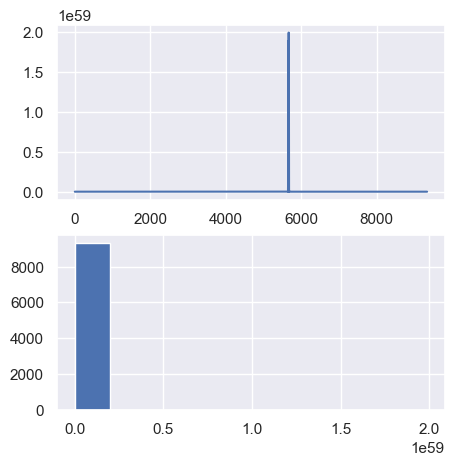

In [76]:
#Exponential transform

dataframe_exp = DataFrame(df3.values)
dataframe_exp.columns = ['Price']
dataframe_exp['Price'] = exp(dataframe_exp['Price'])

# line plot
plt.subplot(211)
plt.plot(dataframe_exp['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_exp['Price'])
plt.show() 

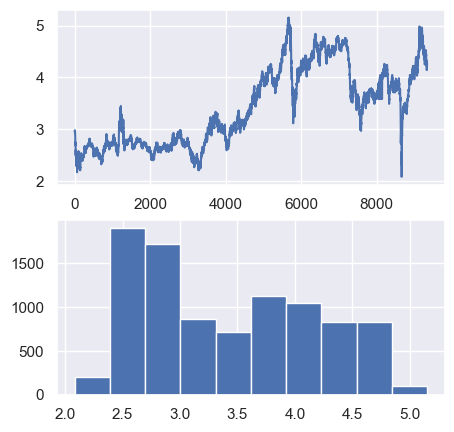

In [77]:
# Cube root transform

dataframe_cbrt = DataFrame(df3.values)
dataframe_cbrt.columns = ['Price']
dataframe_cbrt['Price'] = cbrt(dataframe_cbrt['Price']) 

# line plot
plt.subplot(211)
plt.plot(dataframe_cbrt['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_cbrt['Price'])
plt.show()

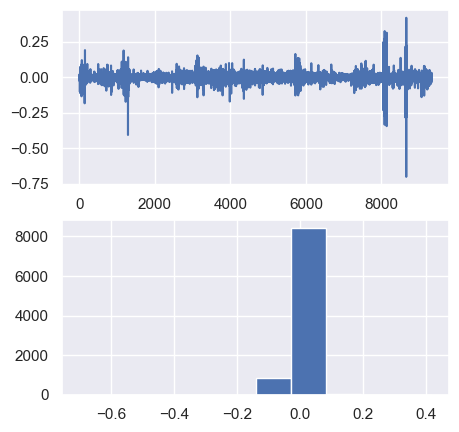

In [78]:
# Log differencing transform

dataframe_log_diff = DataFrame(df3.values)
dataframe_log_diff.columns = ['Price']
dataframe_log_diff['Price'] = log(dataframe_log_diff['Price']) - log(dataframe_log_diff['Price']).shift(1) 

# line plot
plt.subplot(211)
plt.plot(dataframe_log_diff['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_log_diff['Price'])
plt.show() 

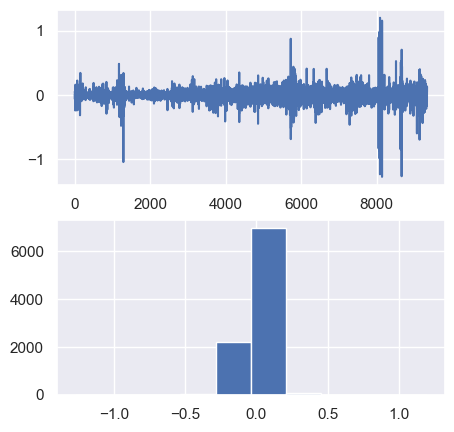

In [79]:
# Square root differencing transform

dataframe_sqrt_diff = DataFrame(df3.values)
dataframe_sqrt_diff.columns = ['Price']
dataframe_sqrt_diff['Price'] = sqrt(dataframe_sqrt_diff['Price']) - sqrt(dataframe_sqrt_diff['Price']).shift(1)  

# line plot
plt.subplot(211)
plt.plot(dataframe_sqrt_diff['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_sqrt_diff['Price'])
plt.show() 

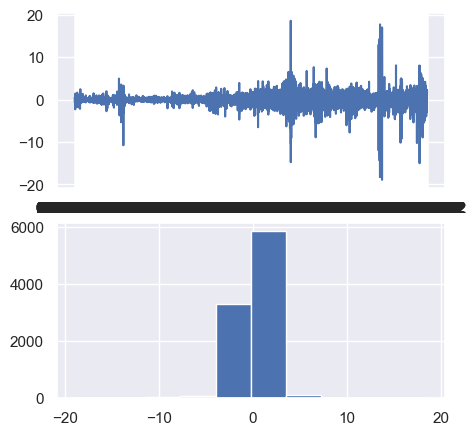

In [80]:
# First order differencing

dataframe_first_diff = df3.diff()[1:]
dataframe_first_diff

# line plot
plt.subplot(211)
plt.plot(dataframe_first_diff['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_first_diff['Price'])
plt.show() 

In [81]:
dataframe_first_diff

,Price
Date,
03-01-1986,0.44
06-01-1986,0.53
07-01-1986,-0.68
08-01-1986,0.02
09-01-1986,0.16
...,...
15-12-2022,-1.17
16-12-2022,-1.82
19-12-2022,0.90


## ACF and PACF plots

### ACf and PACF plots before applying transformations

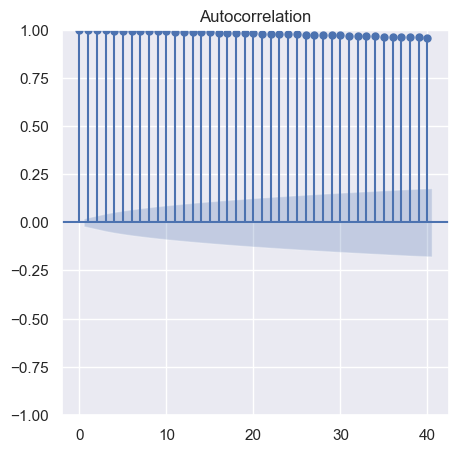

In [82]:
plot_acf(df3['Price'])
plt.show()

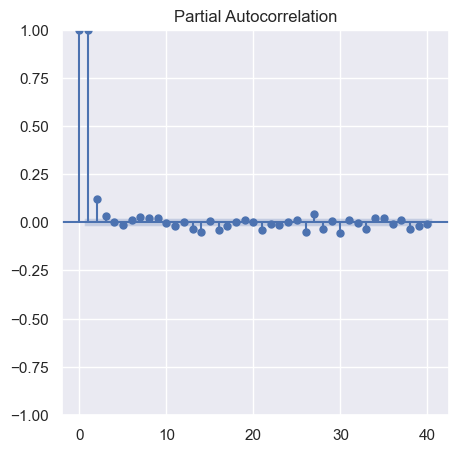

In [83]:
plot_pacf(df3['Price'])
plt.show()

### ACF and PACF plots after applying transformations

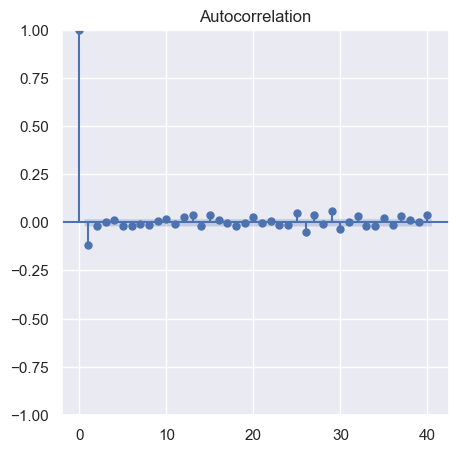

In [84]:
plot_acf(dataframe_first_diff['Price'])
plt.show()

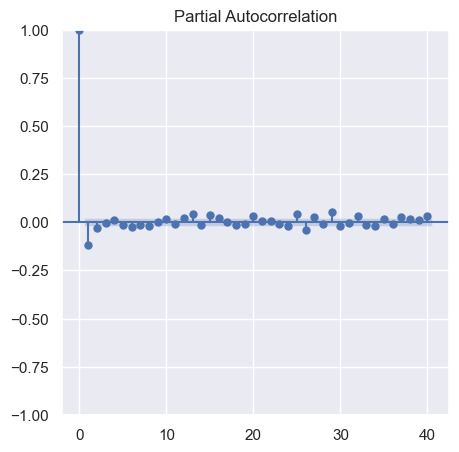

In [85]:
plot_pacf(dataframe_first_diff['Price'])
plt.show()

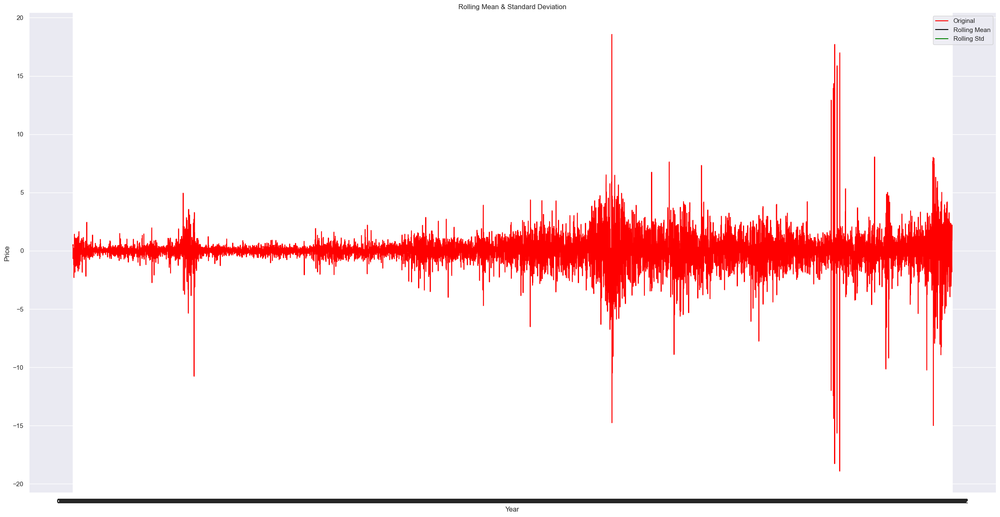

Test statistic: -13.864850158434608
p-value: 6.626515507288409e-26
Critical Values: {'1%': -3.431053874661101, '5%': -2.861851068123899, '10%': -2.566935576484507}


In [86]:
#Nul hypothesis = non-stationary; Alternate hypothesis = Stationary
#if p-value > 0.05 - accept null hypothesis(data is non stationary) else accept alternate hypothesis(data is stationary)
def check_adfuller(dataframe_first_diff):
    result = adfuller(dataframe_first_diff,autolag='AIC')
    print('Test statistic:',result[0])
    print('p-value:',result[1])
    print('Critical Values:',result[4])
def check_mean_std(dataframe_first_diff):
    dataframe_first_diff_log = np.log(dataframe_first_diff)
    moving_avg1 = dataframe_first_diff_log.rolling(12).mean()
    moving_std1 = dataframe_first_diff_log.rolling(12).std()
    plt.figure(figsize=(30,15))
    orig = plt.plot(dataframe_first_diff, color = 'red',label = 'Original')
    mean = plt.plot(moving_avg1, color = 'black',label= 'Rolling Mean')
    std = plt.plot(moving_std1, color = 'green',label= 'Rolling Std')
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
check_mean_std(dataframe_first_diff)
check_adfuller(dataframe_first_diff.Price)

Here, the p value is less than 0.05 (Critical value). So, Accept Alternate hypothesis i.e., The data is stationary.

In [87]:
df3

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


In [88]:
df5 = dataframe_first_diff.copy()
df5

,Price
Date,
03-01-1986,0.44
06-01-1986,0.53
07-01-1986,-0.68
08-01-1986,0.02
09-01-1986,0.16
...,...
15-12-2022,-1.17
16-12-2022,-1.82
19-12-2022,0.90


In [89]:
df4

,Date,Price,Month,Year
0,1986-02-01,25.56,Feb,1986
1,1986-03-01,26.00,Mar,1986
2,1986-06-01,26.53,Jun,1986
3,1986-07-01,25.85,Jul,1986
4,1986-08-01,25.87,Aug,1986
...,...,...,...,...
9327,2022-12-15,76.11,Dec,2022
9328,2022-12-16,74.29,Dec,2022
9329,2022-12-19,75.19,Dec,2022
9330,2022-12-20,76.09,Dec,2022


In [90]:
df6 = df4.copy()
df6

,Date,Price,Month,Year
0,1986-02-01,25.56,Feb,1986
1,1986-03-01,26.00,Mar,1986
2,1986-06-01,26.53,Jun,1986
3,1986-07-01,25.85,Jul,1986
4,1986-08-01,25.87,Aug,1986
...,...,...,...,...
9327,2022-12-15,76.11,Dec,2022
9328,2022-12-16,74.29,Dec,2022
9329,2022-12-19,75.19,Dec,2022
9330,2022-12-20,76.09,Dec,2022


In [91]:
X = pd.DataFrame({"t":range(1,9333)})
X

,t
0,1
1,2
2,3
3,4
4,5
...,...
9327,9328
9328,9329
9329,9330
9330,9331


In [92]:
X['t_square'] = X['t']**2
X

,t,t_square
0,1,1
1,2,4
2,3,9
3,4,16
4,5,25
...,...,...
9327,9328,87011584
9328,9329,87030241
9329,9330,87048900
9330,9331,87067561


In [93]:
df7=df6.drop('Year', axis=1)
df7

,Date,Price,Month
0,1986-02-01,25.56,Feb
1,1986-03-01,26.00,Mar
2,1986-06-01,26.53,Jun
3,1986-07-01,25.85,Jul
4,1986-08-01,25.87,Aug
...,...,...,...
9327,2022-12-15,76.11,Dec
9328,2022-12-16,74.29,Dec
9329,2022-12-19,75.19,Dec
9330,2022-12-20,76.09,Dec


In [94]:
df7['log_Price'] = np.log(df7['Price'])
df7

,Date,Price,Month,log_Price
0,1986-02-01,25.56,Feb,3.241029
1,1986-03-01,26.00,Mar,3.258097
2,1986-06-01,26.53,Jun,3.278276
3,1986-07-01,25.85,Jul,3.252311
4,1986-08-01,25.87,Aug,3.253084
...,...,...,...,...
9327,2022-12-15,76.11,Dec,4.332180
9328,2022-12-16,74.29,Dec,4.307976
9329,2022-12-19,75.19,Dec,4.320018
9330,2022-12-20,76.09,Dec,4.331917


In [95]:
df8 = pd.get_dummies(df7, columns=['Month'])
df8

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep
0,1986-02-01,25.56,3.241029,0,0,0,1,0,0,0,0,0,0,0,0
1,1986-03-01,26.00,3.258097,0,0,0,0,0,0,0,1,0,0,0,0
2,1986-06-01,26.53,3.278276,0,0,0,0,0,0,1,0,0,0,0,0
3,1986-07-01,25.85,3.252311,0,0,0,0,0,1,0,0,0,0,0,0
4,1986-08-01,25.87,3.253084,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9327,2022-12-15,76.11,4.332180,0,0,1,0,0,0,0,0,0,0,0,0
9328,2022-12-16,74.29,4.307976,0,0,1,0,0,0,0,0,0,0,0,0
9329,2022-12-19,75.19,4.320018,0,0,1,0,0,0,0,0,0,0,0,0
9330,2022-12-20,76.09,4.331917,0,0,1,0,0,0,0,0,0,0,0,0


In [96]:
df9 = pd.concat([df8, X], axis=1)
df9

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,t,t_square
0,1986-02-01,25.56,3.241029,0,0,0,1,0,0,0,0,0,0,0,0,1,1
1,1986-03-01,26.00,3.258097,0,0,0,0,0,0,0,1,0,0,0,0,2,4
2,1986-06-01,26.53,3.278276,0,0,0,0,0,0,1,0,0,0,0,0,3,9
3,1986-07-01,25.85,3.252311,0,0,0,0,0,1,0,0,0,0,0,0,4,16
4,1986-08-01,25.87,3.253084,0,1,0,0,0,0,0,0,0,0,0,0,5,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9327,2022-12-15,76.11,4.332180,0,0,1,0,0,0,0,0,0,0,0,0,9328,87011584
9328,2022-12-16,74.29,4.307976,0,0,1,0,0,0,0,0,0,0,0,0,9329,87030241
9329,2022-12-19,75.19,4.320018,0,0,1,0,0,0,0,0,0,0,0,0,9330,87048900
9330,2022-12-20,76.09,4.331917,0,0,1,0,0,0,0,0,0,0,0,0,9331,87067561


# Partitioning the data

In [97]:
Train = df9.head(6160) #66%
Test = df9.tail(3172) #33%

In [98]:
Train

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,t,t_square
0,1986-02-01,25.56,3.241029,0,0,0,1,0,0,0,0,0,0,0,0,1,1
1,1986-03-01,26.00,3.258097,0,0,0,0,0,0,0,1,0,0,0,0,2,4
2,1986-06-01,26.53,3.278276,0,0,0,0,0,0,1,0,0,0,0,0,3,9
3,1986-07-01,25.85,3.252311,0,0,0,0,0,1,0,0,0,0,0,0,4,16
4,1986-08-01,25.87,3.253084,0,1,0,0,0,0,0,0,0,0,0,0,5,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6155,2010-06-15,76.84,4.341725,0,0,0,0,0,0,1,0,0,0,0,0,6156,37896336
6156,2010-06-16,77.67,4.352469,0,0,0,0,0,0,1,0,0,0,0,0,6157,37908649
6157,2010-06-17,76.82,4.341465,0,0,0,0,0,0,1,0,0,0,0,0,6158,37920964
6158,2010-06-18,77.18,4.346140,0,0,0,0,0,0,1,0,0,0,0,0,6159,37933281


In [99]:
Test

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,t,t_square
6160,2010-06-22,77.15,4.345752,0,0,0,0,0,0,1,0,0,0,0,0,6161,37957921
6161,2010-06-23,75.90,4.329417,0,0,0,0,0,0,1,0,0,0,0,0,6162,37970244
6162,2010-06-24,75.96,4.330207,0,0,0,0,0,0,1,0,0,0,0,0,6163,37982569
6163,2010-06-25,78.45,4.362461,0,0,0,0,0,0,1,0,0,0,0,0,6164,37994896
6164,2010-06-28,78.26,4.360037,0,0,0,0,0,0,1,0,0,0,0,0,6165,38007225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9327,2022-12-15,76.11,4.332180,0,0,1,0,0,0,0,0,0,0,0,0,9328,87011584
9328,2022-12-16,74.29,4.307976,0,0,1,0,0,0,0,0,0,0,0,0,9329,87030241
9329,2022-12-19,75.19,4.320018,0,0,1,0,0,0,0,0,0,0,0,0,9330,87048900
9330,2022-12-20,76.09,4.331917,0,0,1,0,0,0,0,0,0,0,0,0,9331,87067561


In [100]:
def MAPE(pred, org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp)

# Model Building

## Model Based Method

### Linear

In [101]:
linear_model = smf.ols('Price~t',data=Train).fit()
pred_linear_model = pd.Series(linear_model.predict(pd.DataFrame(Test)))
pred_linear_model 

6160    63.522996
6161    63.532889
6162    63.542783
6163    63.552677
6164    63.562570
          ...    
9327    94.855951
9328    94.865845
9329    94.875739
9330    94.885632
9331    94.895526
Length: 3172, dtype: float64

In [102]:
linear_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.571
Method:                 Least Squares   F-statistic:                     8182.
Date:                Sat, 04 Feb 2023   Prob (F-statistic):               0.00
Time:                        12:17:52   Log-Likelihood:                -25529.
No. Observations:                6160   AIC:                         5.106e+04
Df Residuals:                    6158   BIC:                         5.108e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.5687      0.389      6.603      0.000       1.806       3.331
t              0.0099      0.000     90.457      0.000       0.010       0.010
==============================================================================
Omnibus:                     1695.023   Durbin-Watson:                   0.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5775.264
Skew:                           1.369   Prob(JB):                         0.00
Kurtosis:                       6.873   Cond. No.                     7.11e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.11e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [103]:
MAPE_linear=MAPE(pred_linear_model,Test.Price) 
MAPE_linear 

48.066785334303006

In [104]:
rmse_linear_model= np.sqrt(np.mean((np.array(Test['Price'])-np.array(pred_linear_model))**2)) 
rmse_linear_model 

29.18313959712434

## Exponential

In [105]:
exp_model = smf.ols('log_Price~t',data=Train).fit()
pred_exp_model = pd.Series(exp_model.predict(pd.DataFrame(Test)))
pred_exp_model 

6160    4.112684
6161    4.112943
6162    4.113201
6163    4.113460
6164    4.113719
          ...   
9327    4.932324
9328    4.932582
9329    4.932841
9330    4.933100
9331    4.933359
Length: 3172, dtype: float64

In [106]:
exp_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_Price   R-squared:                       0.665
Model:                            OLS   Adj. R-squared:                  0.665
Method:                 Least Squares   F-statistic:                 1.223e+04
Date:                Sat, 04 Feb 2023   Prob (F-statistic):               0.00
Time:                        12:18:02   Log-Likelihood:                -1847.0
No. Observations:                6160   AIC:                             3698.
Df Residuals:                    6158   BIC:                             3711.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.5182      0.008    302.513      0.000       2.502       2.534
t              0.0003   2.34e-06    110.587      0.000       0.000       0.000
==============================================================================
Omnibus:                       15.574   Durbin-Watson:                   0.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               16.710
Skew:                          -0.088   Prob(JB):                     0.000235
Kurtosis:                       3.185   Cond. No.                     7.11e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.11e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [107]:
MAPE_exp = MAPE(pred_exp_model, Test.Price)
MAPE_exp

92.69898002609854

In [108]:
rmse_exp_model = np.sqrt(np.mean((np.array(Test['Price']))**2))
rmse_exp_model

74.50066001488985

### Quadratic

In [109]:
quad_model = smf.ols('Price~t+t_square',data=Train).fit()
pred_quad_model = pd.Series(quad_model.predict(Test))
pred_quad_model 

6160     86.880845
6161     86.913486
6162     86.946134
6163     86.978790
6164     87.011453
           ...    
9327    227.269357
9328    227.325381
9329    227.381411
9330    227.437450
9331    227.493495
Length: 3172, dtype: float64

In [110]:
quad_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                 1.040e+04
Date:                Sat, 04 Feb 2023   Prob (F-statistic):               0.00
Time:                        12:18:04   Log-Likelihood:                -23585.
No. Observations:                6160   AIC:                         4.718e+04
Df Residuals:                    6157   BIC:                         4.720e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     25.9265      0.426     60.895      0.000      25.092      26.761
t             -0.0129      0.000    -40.260      0.000      -0.013      -0.012
t_square    3.692e-06   5.02e-08     73.593      0.000    3.59e-06    3.79e-06
==============================================================================
Omnibus:                     2087.618   Durbin-Watson:                   0.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            16541.656
Skew:                           1.401   Prob(JB):                         0.00
Kurtosis:                      10.523   Cond. No.                     5.09e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.09e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [111]:
MAPE_quad = MAPE(pred_quad_model, Test.Price)
MAPE_quad

150.72951696947075

In [112]:
rmse_quad_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_quad_model)))**2))
rmse_quad_model

3.435598054094539e+97

### ARIMA Model

In [113]:
Train1 = df5.head(6160) #66.6%
Test1 = df5.tail(3171) #33.3% 

In [114]:
Train1

,Price
Date,
03-01-1986,0.44
06-01-1986,0.53
07-01-1986,-0.68
08-01-1986,0.02
09-01-1986,0.16
...,...
16-06-2010,0.83
17-06-2010,-0.85
18-06-2010,0.36


In [115]:
Test1

,Price
Date,
23-06-2010,-1.25
24-06-2010,0.06
25-06-2010,2.49
28-06-2010,-0.19
29-06-2010,-2.33
...,...
15-12-2022,-1.17
16-12-2022,-1.82
19-12-2022,0.90


In [116]:
stepwise_fit = auto_arima(df5['Price'], trace=True,
suppress_warnings=True) 
stepwise_fit.summary() 

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=32191.253, Time=6.01 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=32321.990, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=32193.798, Time=0.50 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=32187.390, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=32320.150, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=32187.347, Time=2.30 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=32188.859, Time=1.28 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=32189.033, Time=5.99 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=32187.144, Time=1.03 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=32188.899, Time=1.38 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=32191.143, Time=1.58 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=32185.357, Time=0.48 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=32185.597, Time=0.33 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=32187.246, Time=1.97 sec
 ARIMA(0,0,3)(0,0,0

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 9331
Model:               SARIMAX(0, 0, 2)   Log Likelihood              -16089.679
Date:                Sat, 04 Feb 2023   AIC                          32185.357
Time:                        12:18:36   BIC                          32206.781
Sample:                             0   HQIC                         32192.634
                               - 9331                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.1213      0.003    -40.770      0.000      -0.127      -0.115
ma.L2         -0.0155      0.006     -2.703      0.007      -0.027      -0.004
sigma2         1.8418      0.007    257.533      0.000       1.828       1.856
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            356642.45
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):              11.12   Skew:                            -0.67
Prob(H) (two-sided):                  0.00   Kurtosis:                        33.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [117]:
arima_model=ARIMA(Train1['Price'],order=(0,0,2))
arima_model=arima_model.fit()
arima_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Price   No. Observations:                 6160
Model:                 ARIMA(0, 0, 2)   Log Likelihood               -8970.539
Date:                Sat, 04 Feb 2023   AIC                          17949.078
Time:                        12:18:37   BIC                          17975.981
Sample:                             0   HQIC                         17958.408
                               - 6160                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0084      0.012      0.682      0.495      -0.016       0.032
ma.L1         -0.0604      0.003    -17.364      0.000      -0.067      -0.054
ma.L2         -0.0247      0.006     -4.114      0.000      -0.037      -0.013
sigma2         1.0775      0.005    227.429      0.000       1.068       1.087
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):            278263.74
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               6.98   Skew:                             0.06
Prob(H) (two-sided):                  0.00   Kurtosis:                        35.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [118]:
start = len(Train1)
end = len(Train1) + len(Test1) - 1

In [119]:
start

6160

In [120]:
end

9330

In [121]:
pred_arima_model = arima_model.predict(start=start,end=end,typ='levels').rename('ARIMA Predictions')
pred_arima_model 

6160    0.031537
6161    0.024473
6162    0.008368
6163    0.008368
6164    0.008368
          ...   
9326    0.008368
9327    0.008368
9328    0.008368
9329    0.008368
9330    0.008368
Name: ARIMA Predictions, Length: 3171, dtype: float64

<AxesSubplot: xlabel='Date'>

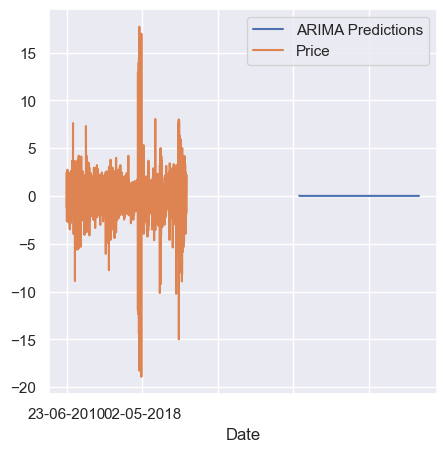

In [122]:
pred_arima_model.plot(legend=True)
Test1['Price'].plot(legend=True) 

In [123]:
from sklearn.metrics import mean_squared_error
from math import sqrt 

In [124]:
rmse_arima_model=sqrt(mean_squared_error(pred_arima_model,Test1['Price']))
print(rmse_arima_model)  

1.8434692984607286


# FB Prophet Model

In [125]:
#!pip install prophet

In [126]:
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet 

In [127]:
df10 = df3.reset_index()
df10

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [128]:
df11 = df10.copy()
df11

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [129]:
df11.columns = ['ds', 'y']
df11

,ds,y
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [130]:
df11.dtypes

ds     object
y     float64
dtype: object

In [131]:
df11['ds'] = pd.to_datetime(df11['ds'])
df11

,ds,y
0,1986-02-01,25.56
1,1986-03-01,26.00
2,1986-06-01,26.53
3,1986-07-01,25.85
4,1986-08-01,25.87
...,...,...
9327,2022-12-15,76.11
9328,2022-12-16,74.29
9329,2022-12-19,75.19
9330,2022-12-20,76.09


In [132]:
df11.dtypes

ds    datetime64[ns]
y            float64
dtype: object

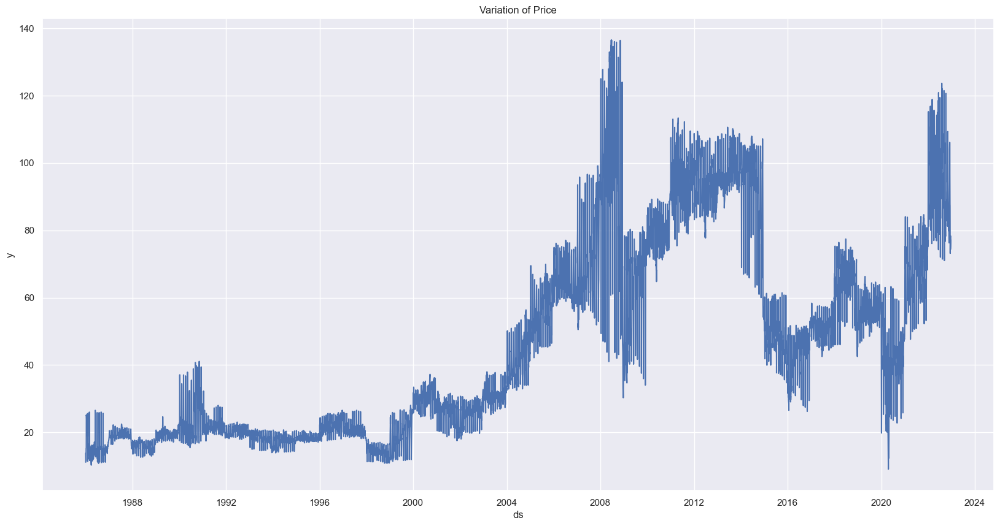

In [133]:
plt.figure(figsize=(20,10))
sns.lineplot(x=df11['ds'],y=df11['y'],data=df11)
plt.title('Variation of Price')
plt.show()

In [134]:
#Data Partition
Train2 = df11.iloc[:len(df11)-150] # Total data except last 150 observations
Test2 = df11.iloc[len(df11)-150:] # Only last 150 observations

In [135]:
prophet_model = Prophet()
prophet_model.fit(Train2)
future = prophet_model.make_future_dataframe(periods=391) 
forecast_prophet = prophet_model.predict(future)

12:19:27 - cmdstanpy - INFO - Chain [1] start processing
12:19:44 - cmdstanpy - INFO - Chain [1] done processing


In [136]:
forecast_prophet

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1986-01-04,14.971748,2.471114,28.009573,14.971748,14.971748,-0.178918,-0.178918,-0.178918,0.607648,0.607648,0.607648,-0.786566,-0.786566,-0.786566,0.0,0.0,0.0,14.792830
1,1986-01-05,14.975790,0.730922,26.309514,14.975790,14.975790,-1.053455,-1.053455,-1.053455,-0.339391,-0.339391,-0.339391,-0.714064,-0.714064,-0.714064,0.0,0.0,0.0,13.922335
2,1986-01-07,14.983873,2.037830,26.922601,14.983873,14.983873,-0.691917,-0.691917,-0.691917,-0.095856,-0.095856,-0.095856,-0.596061,-0.596061,-0.596061,0.0,0.0,0.0,14.291957
3,1986-01-08,14.987915,0.854071,27.185978,14.987915,14.987915,-0.766307,-0.766307,-0.766307,-0.214363,-0.214363,-0.214363,-0.551944,-0.551944,-0.551944,0.0,0.0,0.0,14.221608
4,1986-01-10,14.995999,1.149842,27.068779,14.995999,14.995999,-0.689596,-0.689596,-0.689596,-0.194426,-0.194426,-0.194426,-0.495171,-0.495171,-0.495171,0.0,0.0,0.0,14.306403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9568,2023-12-27,69.324773,53.154476,81.824962,66.168925,72.962264,-1.788257,-1.788257,-1.788257,-0.214363,-0.214363,-0.214363,-1.573894,-1.573894,-1.573894,0.0,0.0,0.0,67.536515
9569,2023-12-28,69.331143,54.600403,82.309587,66.162515,72.994682,-1.335970,-1.335970,-1.335970,0.145579,0.145579,0.145579,-1.481549,-1.481549,-1.481549,0.0,0.0,0.0,67.995173
9570,2023-12-29,69.337513,53.469684,82.551010,66.143832,73.020779,-1.580097,-1.580097,-1.580097,-0.194426,-0.194426,-0.194426,-1.385671,-1.385671,-1.385671,0.0,0.0,0.0,67.757417
9571,2023-12-30,69.343884,56.106781,83.074439,66.137110,73.053032,-0.680195,-0.680195,-0.680195,0.607648,0.607648,0.607648,-1.287844,-1.287844,-1.287844,0.0,0.0,0.0,68.663688


In [137]:
forecast_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']] 

,ds,yhat,yhat_lower,yhat_upper
0,1986-01-04,14.792830,2.471114,28.009573
1,1986-01-05,13.922335,0.730922,26.309514
2,1986-01-07,14.291957,2.037830,26.922601
3,1986-01-08,14.221608,0.854071,27.185978
4,1986-01-10,14.306403,1.149842,27.068779
...,...,...,...,...
9568,2023-12-27,67.536515,53.154476,81.824962
9569,2023-12-28,67.995173,54.600403,82.309587
9570,2023-12-29,67.757417,53.469684,82.551010
9571,2023-12-30,68.663688,56.106781,83.074439


In [138]:
Fcast = forecast_prophet.set_index('ds')[['yhat','yhat_lower','yhat_upper']].join(Train2.set_index('ds')) 
Fcast 

,yhat,yhat_lower,yhat_upper,y
ds,,,,
1986-01-04,14.792830,2.471114,28.009573,11.13
1986-01-05,13.922335,0.730922,26.309514,13.80
1986-01-07,14.291957,2.037830,26.922601,12.39
1986-01-08,14.221608,0.854071,27.185978,11.56
1986-01-10,14.306403,1.149842,27.068779,15.23
...,...,...,...,...
2023-12-27,67.536515,53.154476,81.824962,NaN
2023-12-28,67.995173,54.600403,82.309587,NaN
2023-12-29,67.757417,53.469684,82.551010,NaN


In [139]:
Test2

,ds,y
9182,2022-05-19,112.21
9183,2022-05-20,113.23
9184,2022-05-23,110.29
9185,2022-05-24,109.77
9186,2022-05-25,110.33
...,...,...
9327,2022-12-15,76.11
9328,2022-12-16,74.29
9329,2022-12-19,75.19
9330,2022-12-20,76.09


## FB Prophet Visualisation

In [140]:
plot_plotly(prophet_model ,forecast_prophet) 

In [141]:
plot_components_plotly(prophet_model, forecast_prophet) 

In [142]:
pred_prophet = forecast_prophet.iloc[-391:]['yhat'] 
pred_prophet 

9182    65.150761
9183    64.983650
9184    65.294540
9185    64.906186
9186    65.661835
          ...    
9568    67.536515
9569    67.995173
9570    67.757417
9571    68.663688
9572    67.821170
Name: yhat, Length: 391, dtype: float64

In [143]:
from  sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score 
from statsmodels.tools.eval_measures import rmse 

In [144]:
## Calculate MAE,MSE,R-Squared between expected and predicted values  
y_true = Train2['y'].iloc[:9182] 
y_pred = Fcast['yhat'].iloc[:9182] 
mae = mean_absolute_error(y_true,y_pred)
mse = mean_squared_error(y_true,y_pred)
rmse = sqrt(mean_squared_error(y_true,y_pred))
print('rmse: %.2f' % rmse)
print('MAE: %.2f' % mae)
print('MSE: %.2f' % mse)
r = r2_score(y_true,y_pred)
print('R-squared Score: %.2f'% r) 

rmse: 9.82
MAE: 6.15
MSE: 96.44
R-squared Score: 0.88


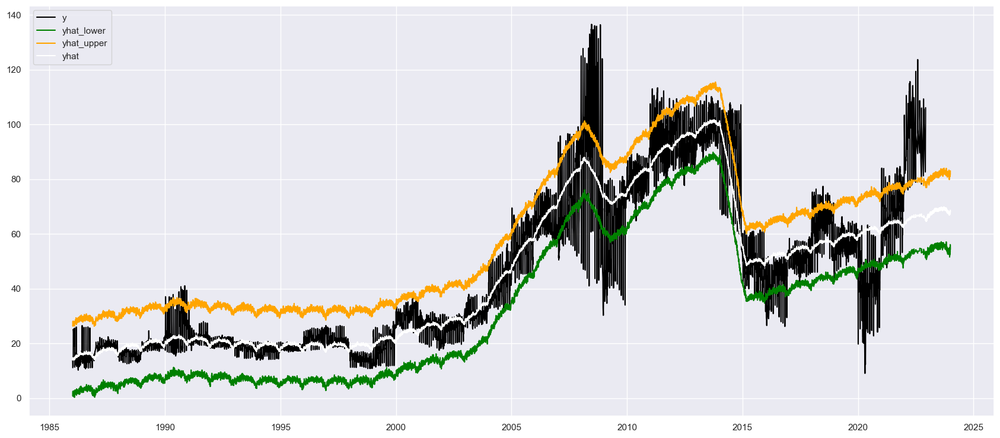

In [145]:
plt.figure(figsize=(21,9))
label=['y','yhat_lower','yhat_upper','yhat']
plt.plot(Fcast['y'],color='black')
plt.plot(Fcast['yhat_lower'],color='Green')
plt.plot(Fcast['yhat_upper'],color='Orange') 
plt.plot(Fcast['yhat'],color='White') 
plt.legend(label)
plt.show() 

## Naive Model( Lst Simple Method)

In [146]:
Train3 = df10.head(6160)
Test3 = df10.tail(3172) 

In [147]:
y_hat=Test3.copy()
y_hat 

,Date,Price
6160,22-06-2010,77.15
6161,23-06-2010,75.90
6162,24-06-2010,75.96
6163,25-06-2010,78.45
6164,28-06-2010,78.26
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [148]:
df3=np.asarray(Train3.Price)
df3 

array([25.56, 26.  , 26.53, ..., 76.82, 77.18, 77.84])

In [149]:
y_hat['naive']=df3[len(df3)-1]
y_hat 

,Date,Price,naive
6160,22-06-2010,77.15,77.84
6161,23-06-2010,75.90,77.84
6162,24-06-2010,75.96,77.84
6163,25-06-2010,78.45,77.84
6164,28-06-2010,78.26,77.84
...,...,...,...
9327,15-12-2022,76.11,77.84
9328,16-12-2022,74.29,77.84
9329,19-12-2022,75.19,77.84
9330,20-12-2022,76.09,77.84


In [150]:
rmse_naive_model = np.sqrt(np.mean((np.array(Test3['Price'])-np.array(np.exp(y_hat['naive'])))**2))
rmse_naive_model 

6.389729471063823e+33

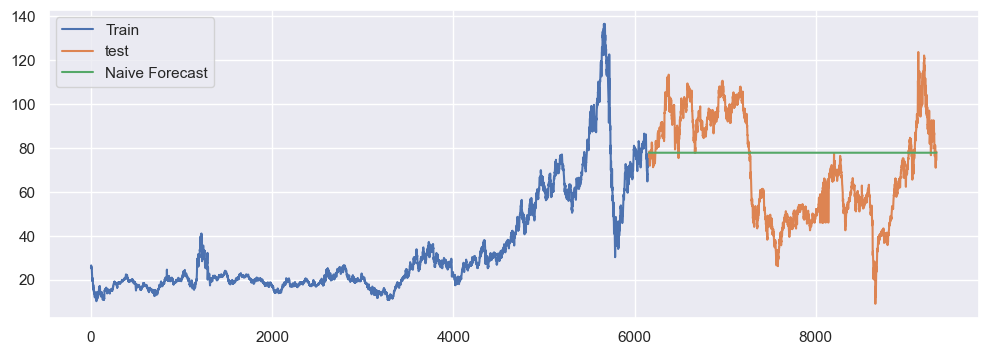

In [151]:
plt.figure(figsize=(12,4))
plt.plot(Train3['Price'], label='Train')
plt.plot(Test3['Price'], label='test')
plt.plot(y_hat['naive'], label='Naive Forecast')
plt.legend(loc='best')
plt.show()

## Simple Averages Method

In [152]:
y_hat_avg=Test3.copy()
y_hat_avg 

,Date,Price
6160,22-06-2010,77.15
6161,23-06-2010,75.90
6162,24-06-2010,75.96
6163,25-06-2010,78.45
6164,28-06-2010,78.26
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [153]:
y_hat_avg['avg_forecast']=Train3['Price'].mean()
y_hat_avg 

,Date,Price,avg_forecast
6160,22-06-2010,77.15,33.045834
6161,23-06-2010,75.90,33.045834
6162,24-06-2010,75.96,33.045834
6163,25-06-2010,78.45,33.045834
6164,28-06-2010,78.26,33.045834
...,...,...,...
9327,15-12-2022,76.11,33.045834
9328,16-12-2022,74.29,33.045834
9329,19-12-2022,75.19,33.045834
9330,20-12-2022,76.09,33.045834


In [154]:
rmse_simple_model = np.sqrt(np.mean((np.array(Test3['Price'])-np.array(np.exp(y_hat_avg['avg_forecast'])))**2))
rmse_simple_model 

224710588217780.16

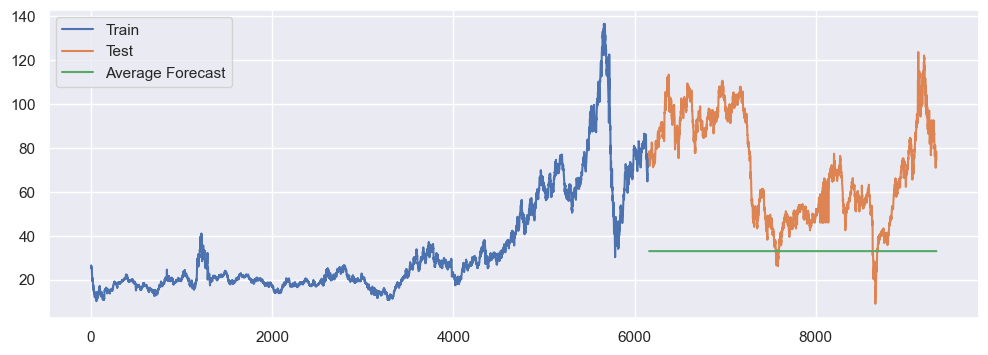

In [155]:
plt.figure(figsize=(12,4))
plt.plot(Train3['Price'], label='Train')
plt.plot(Test3['Price'], label='Test')
plt.plot(y_hat_avg['avg_forecast'], label='Average Forecast')
plt.legend(loc='best')
plt.show() 

## Long Short Term Memory (LSTM) Model

In [156]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import GRU, Dense
from keras.layers import LSTM
from keras  import callbacks
from keras import optimizers 

In [157]:
df2

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


In [158]:
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(df2) 
scaled 

array([[0.12905749],
       [0.13249902],
       [0.13664451],
       ...,
       [0.51724677],
       [0.52428627],
       [0.54149394]])

In [159]:
train_size = int(len(scaled) * 0.66)
test_size = len(scaled - train_size)
train, test = scaled[0:train_size, :], scaled[train_size: len(scaled), :]
print('train: {}\ntest: {}'.format(len(train), len(test)))   

train: 6159
test: 3174


In [160]:
def create_dataset(dataset, look_back=1):
    print(len(dataset), look_back)
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        print(i)
        print('X {} to {}'.format(i, i+look_back))
        print(a)
        print('Y {}'.format(i + look_back))
        print(dataset[i + look_back, 0])
        dataset[i + look_back, 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)  

In [161]:
look_back = 1
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back) 

6159 1
0
X 0 to 1
[0.12905749]
Y 1
0.13249902229174815
1
X 1 to 2
[0.13249902]
Y 2
0.13664450527962457
2
X 2 to 3
[0.13664451]
Y 3
0.13132577238951898
3
X 3 to 4
[0.13132577]
Y 4
0.13148220570981622
4
X 4 to 5
[0.13148221]
Y 5
0.13273367227219401
5
X 5 to 6
[0.13273367]
Y 6
0.1297614391865467
6
X 6 to 7
[0.12976144]
Y 7
0.12530308955807584
7
X 7 to 8
[0.12530309]
Y 8
0.12444270629644115
8
X 8 to 9
[0.12444271]
Y 9
0.126085256159562
9
X 9 to 10
[0.12608526]
Y 10
0.1166992569417286
10
X 10 to 11
[0.11669926]
Y 11
0.11396167383652718
11
X 11 to 12
[0.11396167]
Y 12
0.0959718420023465
12
X 12 to 13
[0.09597184]
Y 13
0.09034024247164647
13
X 13 to 14
[0.09034024]
Y 14
0.08752444270629643
14
X 14 to 15
[0.08752444]
Y 15
0.08502150958154088
15
X 15 to 16
[0.08502151]
Y 16
0.08126710989440751
16
X 16 to 17
[0.08126711]
Y 17
0.09237387563551037
17
X 17 to 18
[0.09237388]
Y 18
0.08126710989440751
18
X 18 to 19
[0.08126711]
Y 19
0.0825185764567853
19
X 19 to 20
[0.08251858]
Y 20
0.082283926476339

[0.08979273]
Y 1851
0.09080954243253815
1851
X 1851 to 1852
[0.09080954]
Y 1852
0.09018380915134923
1852
X 1852 to 1853
[0.09018381]
Y 1853
0.08815017598748533
1853
X 1853 to 1854
[0.08815018]
Y 1854
0.08830660930778257
1854
X 1854 to 1855
[0.08830661]
Y 1855
0.08728979272585059
1855
X 1855 to 1856
[0.08728979]
Y 1856
0.08893234258897144
1856
X 1856 to 1857
[0.08893234]
Y 1857
0.0877590926867423
1857
X 1857 to 1858
[0.08775909]
Y 1858
0.08854125928822838
1858
X 1858 to 1859
[0.08854126]
Y 1859
0.087211576065702
1859
X 1859 to 1860
[0.08721158]
Y 1860
0.08627297614391867
1860
X 1860 to 1861
[0.08627298]
Y 1861
0.08549080954243253
1861
X 1861 to 1862
[0.08549081]
Y 1862
0.08596010950332421
1862
X 1862 to 1863
[0.08596011]
Y 1863
0.08549080954243253
1863
X 1863 to 1864
[0.08549081]
Y 1864
0.08392647633946031
1864
X 1864 to 1865
[0.08392648]
Y 1865
0.08502150958154088
1865
X 1865 to 1866
[0.08502151]
Y 1866
0.08423934298005474
1866
X 1866 to 1867
[0.08423934]
Y 1867
0.087211576065702
1867


[0.10504497]
Y 3998
0.10410637465780213
3998
X 3998 to 3999
[0.10410637]
Y 3999
0.10129057489245212
3999
X 3999 to 4000
[0.10129057]
Y 4000
0.10035197497066876
4000
X 4000 to 4001
[0.10035197]
Y 4001
0.0959718420023465
4001
X 4001 to 4002
[0.09597184]
Y 4002
0.10113414157215485
4002
X 4002 to 4003
[0.10113414]
Y 4003
0.09949159170903403
4003
X 4003 to 4004
[0.09949159]
Y 4004
0.09558075870160344
4004
X 4004 to 4005
[0.09558076]
Y 4005
0.10121235823230347
4005
X 4005 to 4006
[0.10121236]
Y 4006
0.09925694172858819
4006
X 4006 to 4007
[0.09925694]
Y 4007
0.10175987485334377
4007
X 4007 to 4008
[0.10175987]
Y 4008
0.10199452483378961
4008
X 4008 to 4009
[0.10199452]
Y 4009
0.09988267500977709
4009
X 4009 to 4010
[0.09988268]
Y 4010
0.09495502542041455
4010
X 4010 to 4011
[0.09495503]
Y 4011
0.0892452092295659
4011
X 4011 to 4012
[0.08924521]
Y 4012
0.08744622604614781
4012
X 4012 to 4013
[0.08744623]
Y 4013
0.08556902620258115
4013
X 4013 to 4014
[0.08556903]
Y 4014
0.08502150958154088
40

[0.49198279]
Y 5942
0.4842393429800547
5942
X 5942 to 5943
[0.48423934]
Y 5943
0.4812671098944075
5943
X 5943 to 5944
[0.48126711]
Y 5944
0.4724286272976143
5944
X 5944 to 5945
[0.47242863]
Y 5945
0.47727806022682834
5945
X 5945 to 5946
[0.47727806]
Y 5946
0.4811106765741103
5946
X 5946 to 5947
[0.48111068]
Y 5947
0.4571763785686352
5947
X 5947 to 5948
[0.45717638]
Y 5948
0.4509972624168948
5948
X 5948 to 5949
[0.45099726]
Y 5949
0.4705514274540477
5949
X 5949 to 5950
[0.47055143]
Y 5950
0.49651935862338686
5950
X 5950 to 5951
[0.49651936]
Y 5951
0.49542432538130626
5951
X 5951 to 5952
[0.49542433]
Y 5952
0.5010559249120063
5952
X 5952 to 5953
[0.50105592]
Y 5953
0.5054360578803286
5953
X 5953 to 5954
[0.50543606]
Y 5954
0.48916699256941726
5954
X 5954 to 5955
[0.48916699]
Y 5955
0.4874462260461478
5955
X 5955 to 5956
[0.48744623]
Y 5956
0.49612827532264364
5956
X 5956 to 5957
[0.49612828]
Y 5957
0.49792725850606184
5957
X 5957 to 5958
[0.49792726]
Y 5958
0.4764176769651936
5958
X 5958

[0.21885022]
Y 1397
0.21666014861165428
1397
X 1397 to 1398
[0.21666015]
Y 1398
0.21048103245991395
1398
X 1398 to 1399
[0.21048103]
Y 1399
0.1948377004301916
1399
X 1399 to 1400
[0.1948377]
Y 1400
0.18936253421978883
1400
X 1400 to 1401
[0.18936253]
Y 1401
0.18850215095815404
1401
X 1401 to 1402
[0.18850215]
Y 1402
0.17481423543214708
1402
X 1402 to 1403
[0.17481424]
Y 1403
0.16722721939773172
1403
X 1403 to 1404
[0.16722722]
Y 1404
0.16754008603832615
1404
X 1404 to 1405
[0.16754009]
Y 1405
0.17317168556902618
1405
X 1405 to 1406
[0.17317169]
Y 1406
0.15924912006257336
1406
X 1406 to 1407
[0.15924912]
Y 1407
0.15174032068830662
1407
X 1407 to 1408
[0.15174032]
Y 1408
0.13680093859992182
1408
X 1408 to 1409
[0.13680094]
Y 1409
0.1601095033242081
1409
X 1409 to 1410
[0.1601095]
Y 1410
0.18091513492373873
1410
X 1410 to 1411
[0.18091513]
Y 1411
0.1664450527962456
1411
X 1411 to 1412
[0.16644505]
Y 1412
0.17512710207274151
1412
X 1412 to 1413
[0.1751271]
Y 1413
0.18177551818537346
1413
X

In [162]:
## Reshaping the input data 
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
print(X_train.shape)
print(X_test.shape) 

(6157, 1, 1)
(3172, 1, 1)


In [ ]:
batch_size = 1
model_lstm = Sequential()
model_lstm.add(LSTM(4, batch_input_shape=(batch_size, look_back, 1), stateful=True))
model_lstm.add(Dense(1))
model_lstm.compile(loss='mean_squared_error', optimizer='adam')
model_lstm.fit(X_train, y_train, epochs=100, batch_size=batch_size, verbose=2, shuffle=True)  

Epoch 1/100
6157/6157 - 15s - loss: 0.0054 - 15s/epoch - 2ms/step
Epoch 2/100
6157/6157 - 11s - loss: 1.8046e-04 - 11s/epoch - 2ms/step
Epoch 3/100
6157/6157 - 11s - loss: 1.3848e-04 - 11s/epoch - 2ms/step
Epoch 4/100
6157/6157 - 11s - loss: 1.2216e-04 - 11s/epoch - 2ms/step
Epoch 5/100
6157/6157 - 11s - loss: 1.1471e-04 - 11s/epoch - 2ms/step
Epoch 6/100
6157/6157 - 11s - loss: 1.1055e-04 - 11s/epoch - 2ms/step
Epoch 7/100
6157/6157 - 11s - loss: 1.0685e-04 - 11s/epoch - 2ms/step
Epoch 8/100
6157/6157 - 11s - loss: 1.0355e-04 - 11s/epoch - 2ms/step
Epoch 9/100
6157/6157 - 11s - loss: 1.0150e-04 - 11s/epoch - 2ms/step
Epoch 10/100
6157/6157 - 11s - loss: 1.0329e-04 - 11s/epoch - 2ms/step
Epoch 11/100
6157/6157 - 11s - loss: 1.0142e-04 - 11s/epoch - 2ms/step
Epoch 12/100
6157/6157 - 11s - loss: 1.0109e-04 - 11s/epoch - 2ms/step
Epoch 13/100
6157/6157 - 11s - loss: 9.9084e-05 - 11s/epoch - 2ms/step
Epoch 14/100
6157/6157 - 11s - loss: 9.5763e-05 - 11s/epoch - 2ms/step
Epoch 15/100
6157/6

In [ ]:
trainPredict = model_lstm.predict(X_train, batch_size=batch_size)
trainPredict

In [ ]:
model_lstm.reset_states() 

In [ ]:
testPredict = model_lstm.predict(X_test, batch_size=batch_size)
testPredict

In [ ]:
trainPredict = scaler.inverse_transform(trainPredict)
trainPredict

In [ ]:
y_train = scaler.inverse_transform([y_train])
y_train

In [ ]:
testPredict = scaler.inverse_transform(testPredict)
testPredict 

In [ ]:
y_test = scaler.inverse_transform([y_test])
y_test

In [ ]:
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(y_train[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(y_test[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore)) 

In [ ]:
print('R2 score:',r2_score(y_train[0],trainPredict[:,0])) 

In [ ]:
trainPredictPlot = np.empty_like(scaled)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(scaled)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(scaled)-1, :] = testPredict
# plot baseline and predictions

plt.plot(scaler.inverse_transform(scaled))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()